In [1]:
# pip install xarray netCDF4 pandas numpy scikit-learn xgboost joblib

import numpy as np
import pandas as pd
import xarray as xr
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_absolute_error
import joblib


In [3]:
stats_df = pd.read_csv("/Users/lb962/Documents/GitHub/ESL_stats/data/processed/stations_msnumerical_vars_bearing.csv")
#weathercluster_df = pd.read_csv("/Users/lb962/Documents/GitHub/ESL_stats/notebooks/C_KDE/weather_7.csv")
GEV_clusters = pd.read_csv("/Users/lb962/Documents/GitHub/ESL_stats/notebooks/C_KDE/AAFINAL_KMMFIT_4_msl.csv")
Static_contr = pd.read_csv("/Users/lb962/Documents/GitHub/ESL_stats/notebooks/C_KDE/static_contributers.csv")

stats_df["station"] = stats_df["station"].astype(int)
stats_df["lat"] = stats_df["coast_lat"]
stats_df["lon"] = stats_df["coast_lon"]
GEV_clusters["station"] = GEV_clusters["station"].astype(int)
GEV_clusters["cluster_id"] = GEV_clusters["cluster"]

#GEV_clusters= GEV_clusters[~GEV_clusters["cluster"].isin([0, 5])].copy()
# Get sorted unique remaining clusters
unique_clusters = sorted( GEV_clusters["cluster"].unique())
# Build mapping → start numbering from 1
cluster_map = {old: new for new, old in enumerate(unique_clusters, start=1)}
# Apply remapping
GEV_clusters["cluster"] =  GEV_clusters["cluster"].map(cluster_map)
Static_contr = Static_contr.drop(columns="cluster")
label_df = GEV_clusters[["station", "cluster", "cluster_id", "lat", "lon"]].dropna().copy()
label_df["cluster"] = label_df["cluster"].astype(int)

# Inner join: only stations that exist in both
model_df = stats_df.merge(label_df, on=["station", "lat", "lon"], how="inner")
model_df = model_df.merge(Static_contr, on=["station","lat", "lon"], how="inner")

In [4]:
model_df.cluster.unique()

array([1, 3, 4, 2])

In [5]:
import pandas as pd
import numpy as np

df = model_df.copy()

# identify column types
numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
categorical_cols = [c for c in df.columns if c not in numeric_cols + ["station"]]

# aggregation rules
agg_dict = {}

# numeric → mean
for col in numeric_cols:
    agg_dict[col] = "mean"

# categorical → first non-null
def first_valid(x):
    return x.dropna().iloc[0] if x.notna().any() else np.nan

for col in categorical_cols:
    agg_dict[col] = first_valid

# group
model_df = (
    df.groupby("station", as_index=False)
      .agg(agg_dict)
)

In [6]:
stats_df_test = pd.read_csv("/Users/lb962/Documents/GitHub/ESL_stats/data/processed/all_numerical_vars_bearing.csv")
Static_contr_test = pd.read_csv("//Users/lb962/Documents/GitHub/ESL_stats/notebooks/C_KDE/static_contributers_test_df.csv")
common_cols = list(set(stats_df_test.columns) & set(Static_contr_test.columns))

stats_df_test = stats_df_test.merge(
    Static_contr_test,
    on=common_cols,
    how="inner"
)

/var/folders/2b/rpgq1g5d5qz2nhbpj5s4jnrc0000gq/T/ipykernel_2100/507732559.py:2: DtypeWarning: Columns (484) have mixed types. Specify dtype option on import or set low_memory=False.
  Static_contr_test = pd.read_csv("//Users/lb962/Documents/GitHub/ESL_stats/notebooks/C_KDE/static_contributers_test_df.csv")


In [7]:
drop_cols = {"station", "cluster"}
forbidden_substrings = ("sea_level","residual","tide","lat","lon","count","missing_frac",
                        "extract_time","name","unnamed", "name", "Unnamed", 'HYRIV' , "gev", "ks", "kuiper", "r2", "dist_to_CVI_m",
                        "dist_to_morpho_m", "status", "H", "id", "ID", "HYR", "GEOM", "POINT")

# Drop any column containing forbidden substrings (case-insensitive)
forbidden_cols = {
    c for c in stats_df_test.columns
    if any(sub in c.lower() for sub in forbidden_substrings)
}
cols_to_drop = drop_cols | forbidden_cols
#model_df = model_df.groupby("station").mean(numeric_only=True)
#model_df = model_df.reset_index().groupby("station").agg(
 #   lambda x: x.max() if pd.api.types.is_numeric_dtype(x)
 #   else x.mode().iloc[0]
#)
# Compute cluster sizes
#cluster_counts = stats_df_test ["cluster_id"].value_counts()

# Keep only stations belonging to clusters with >1 entry
#model_df = model_df[model_df["cluster_id"].isin(cluster_counts[cluster_counts > 1].index)]
# Build feature matrix
X_coastline = stats_df_test .drop(columns=[c for c in cols_to_drop if c in stats_df_test .columns])

In [12]:
model_df.columns

Index(['station', 'swh_am_mean', 'swh_am_std', 'swh_am_max', 'mwp_am_mean',
       'mwp_am_std', 'mwp_am_max', 'wsk_am_mean', 'wsk_am_std', 'wsk_am_max',
       ...
       'wave_status_3x3', 'wind_dir_status_10x10', 'mwd_status_10x10',
       'wind_status_10x10', 'wave_status_10x10', 'geometry', 'CVI_Category',
       'Morpho', 'CoastType', 'coastal_type'],
      dtype='object', length=498)

In [15]:
model_df.CoastType.unique()

array(['Harbor area', 'Estuary',
       'Muddy coastline, including tidal flat, salt marsh',
       'Artificial shoreline (walk, dike, quay) without beach',
       'Erosion-resistant rock and/or cliff, without loose eroded material in the fronting sea',
       'Erodible rock and/or cliff, with rock waste and sediments (sand or pebbles) at its base',
       'Coastal embankment with construction',
       'Gravel beach fronting upland (> 1 km long)',
       'Sand beach fronting upland (> 1 Km long)',
       'Pocket beaches (< 200 m long)', 'Artificial beach',
       'Heterogeneous beach', 'Small beaches',
       'Vegetated (‘green’) beach',
       'Beach that is part of extensive non-cohesive sedimentary systems (barrier, spit, tombolo)'],
      dtype=object)

In [33]:
print("Stations for modeling:", len(model_df))
print(model_df["cluster"].value_counts(dropna=False))

drop_cols = {"station", "cluster"}
forbidden_substrings = ("sea_level","residual","tide","lat","lon","count","missing_frac",
                        "extract_time","name","unnamed", "name", "Unnamed", 'HYRIV' , "gev", "ks", "kuiper", "r2", "dist_to_CVI_m",
                        "dist_to_morpho_m", "status", "H", "id", "ID", "HYR", "GEOM", "POINT")

# Drop any column containing forbidden substrings (case-insensitive)
forbidden_cols = {
    c for c in model_df.columns
    if any(sub in c.lower() for sub in forbidden_substrings)
}
cols_to_drop = drop_cols | forbidden_cols
#model_df = model_df.groupby("station").mean(numeric_only=True)
#model_df = model_df.reset_index().groupby("station").agg(
 #   lambda x: x.max() if pd.api.types.is_numeric_dtype(x)
 #   else x.mode().iloc[0]
#)
# Compute cluster sizes
cluster_counts = model_df["cluster_id"].value_counts()

# Keep only stations belonging to clusters with >1 entry
model_df = model_df[model_df["cluster_id"].isin(cluster_counts[cluster_counts > 1].index)]
# Build feature matrix
X = model_df.drop(columns=[c for c in cols_to_drop if c in model_df.columns])

y = model_df['cluster_id']

Stations for modeling: 254
cluster
2.0    106
1.0     67
3.0     52
4.0     14
6.0     14
5.0      1
Name: count, dtype: int64


In [34]:
forbidden_2 = forbidden_cols | {"station"}
X_coastline = stats_df_test.drop(columns=[c for c in forbidden_2  if c in stats_df_test.columns])

In [35]:
import numpy as np
import pandas as pd
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
X = X.copy()

num_cols = X.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = X.select_dtypes(exclude=[np.number]).columns.tolist()

numeric_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="mean")),
    ("scaler", StandardScaler())
])

categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", OneHotEncoder(handle_unknown="ignore"))
])

preprocessor = ColumnTransformer([
    ("num", numeric_pipeline, num_cols),
    ("cat", categorical_pipeline, cat_cols)
])

from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier

pipe = Pipeline([
    ("preprocess", preprocessor),
    ("smote", SMOTE(random_state=0, k_neighbors=1)),  # safer
    ("rf", RandomForestClassifier(random_state=0, n_jobs=-1))
])
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=0, stratify=y
)
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV

param_dist = {
    "smote__k_neighbors": [1, 2],
    "rf__n_estimators": [300, 500, 800, 1200],
    "rf__max_depth": [None, 10, 20, 30],
    "rf__min_samples_split": [2, 5, 10],
    "rf__min_samples_leaf": [1, 2, 4],
    "rf__max_features": ["sqrt", "log2", 0.5],
    "rf__class_weight": [None, "balanced", "balanced_subsample"]
}

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)

search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_dist,
    n_iter=40,
    scoring="precision_weighted",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=0,
    refit=True,
    error_score="raise"
)
search.fit(X_train, y_train)

print("Best params:")
print(search.best_params_)
print("Best CV score:", search.best_score_)

best_model = search.best_estimator_
pred = best_model.predict(X_test)

from sklearn.metrics import classification_report, accuracy_score
print("Test accuracy:", accuracy_score(y_test, pred))
print(classification_report(y_test, pred))

Fitting 3 folds for each of 40 candidates, totalling 120 fits


/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

Best params:
{'smote__k_neighbors': 1, 'rf__n_estimators': 800, 'rf__min_samples_split': 10, 'rf__min_samples_leaf': 4, 'rf__max_features': 'sqrt', 'rf__max_depth': 10, 'rf__class_weight': 'balanced_subsample'}
Best CV score: 0.7519389250664742
Test accuracy: 0.828125
              precision    recall  f1-score   support

         0.0       0.85      0.65      0.73        17
         1.0       0.86      0.93      0.89        27
         2.0       0.71      0.92      0.80        13
         3.0       1.00      1.00      1.00         4
         5.0       1.00      0.33      0.50         3

    accuracy                           0.83        64
   macro avg       0.88      0.77      0.79        64
weighted avg       0.84      0.83      0.82        64



/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

In [36]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split

# Train/test split for final evaluation
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=0, stratify=y
)

pipe = Pipeline([
    ("smote", SMOTE(random_state=0)),
    ("scaler", StandardScaler()),
    ("rf", RandomForestClassifier(random_state=0, n_jobs=-1))
])

param_dist = {
    "smote__k_neighbors": [3, 5, 7],
    "rf__n_estimators": [300, 500, 800, 1200],
    "rf__max_depth": [None, 10, 20, 30],
    "rf__min_samples_split": [2, 5, 10],
    "rf__min_samples_leaf": [1, 2, 4],
    "rf__max_features": ["sqrt", "log2", 0.5],
    "rf__class_weight": [None, "balanced", "balanced_subsample"]
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_dist,
    n_iter=40,
   # scoring="f1_weighted",   # or "precision_weighted", "balanced_accuracy", etc.
    scoring="precision_weighted",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=0,
    refit=True
)

search.fit(X_train, y_train)

print("Best params:")
print(search.best_params_)
print("Best CV score:", search.best_score_)

best_model = search.best_estimator_
pred = best_model.predict(X_test)

print("Test accuracy:", accuracy_score(y_test, pred))
print(classification_report(y_test, pred))

Fitting 5 folds for each of 40 candidates, totalling 200 fits


ValueError: 
All the 200 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
200 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/imblearn/pipeline.py", line 514, in fit
    Xt, yt = self._fit(X, y, routed_params, raw_params=params)
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/imblearn/pipeline.py", line 436, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/joblib/memory.py", line 312, in __call__
    return self.func(*args, **kwargs)
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/imblearn/pipeline.py", line 1332, in _fit_resample_one
    X_res, y_res = sampler.fit_resample(X, y, **params.get("fit_resample", {}))
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/imblearn/base.py", line 204, in fit_resample
    return super().fit_resample(X, y, **params)
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/imblearn/base.py", line 101, in fit_resample
    X, y, binarize_y = self._check_X_y(X, y)
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/imblearn/base.py", line 159, in _check_X_y
    X, y = validate_data(self, X=X, y=y, reset=True, accept_sparse=accept_sparse)
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn_compat/_sklearn_compat.py", line 425, in validate_data
    return _estimator._validate_data(
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/base.py", line 650, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/utils/validation.py", line 1301, in check_X_y
    X = check_array(
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/utils/validation.py", line 1012, in check_array
    array = _asarray_with_order(array, order=order, dtype=dtype, xp=xp)
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/utils/_array_api.py", line 745, in _asarray_with_order
    array = numpy.asarray(array, order=order, dtype=dtype)
  File "/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/pandas/core/generic.py", line 2153, in __array__
    arr = np.asarray(values, dtype=dtype)
ValueError: could not convert string to float: '0.1x0.1'


/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

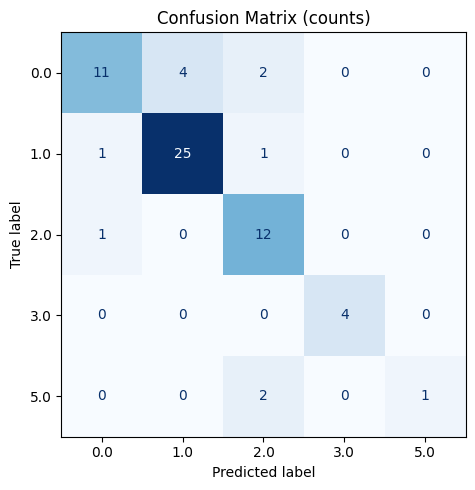

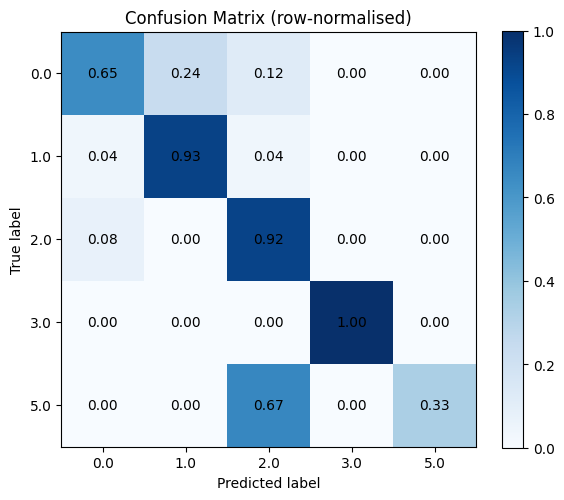

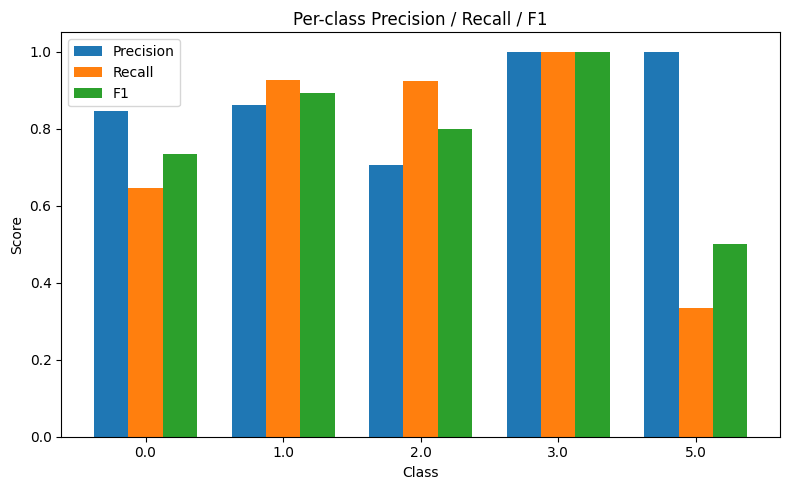

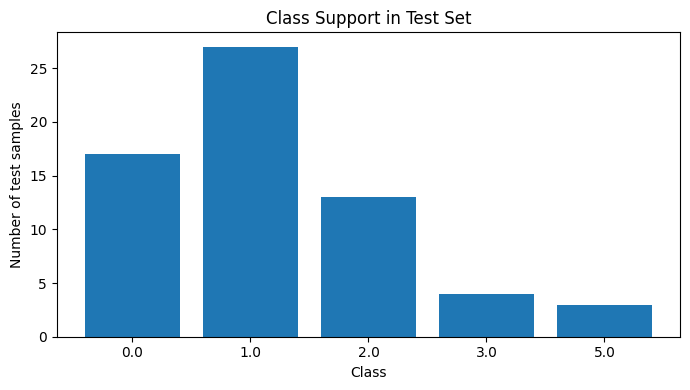

Top confusion pairs:
   true_class  pred_class  count
0         0.0         1.0      4
1         0.0         2.0      2
2         5.0         2.0      2
3         1.0         0.0      1
4         1.0         2.0      1
5         2.0         0.0      1


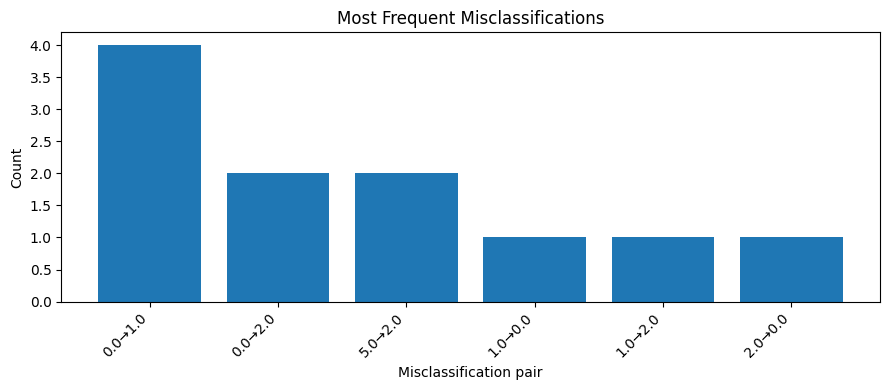

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
    precision_recall_fscore_support
)

# ---- predictions ----
pred = best_model.predict(X_test)

# class labels in sorted order
labels = np.sort(np.unique(y_test))

# -----------------------------
# 1) Raw confusion matrix
# -----------------------------
fig, ax = plt.subplots(figsize=(6, 5))
ConfusionMatrixDisplay.from_predictions(
    y_test, pred,
    labels=labels,
    cmap="Blues",
    ax=ax,
    colorbar=False
)
ax.set_title("Confusion Matrix (counts)")
plt.tight_layout()
plt.show()

# -----------------------------
# 2) Row-normalized confusion matrix
#    (recall-oriented: how each true class gets distributed)
# -----------------------------
cm = confusion_matrix(y_test, pred, labels=labels)
cm_norm = cm / cm.sum(axis=1, keepdims=True)

fig, ax = plt.subplots(figsize=(6, 5))
im = ax.imshow(cm_norm, interpolation="nearest", cmap="Blues")
ax.set_title("Confusion Matrix (row-normalised)")
ax.set_xlabel("Predicted label")
ax.set_ylabel("True label")
ax.set_xticks(np.arange(len(labels)))
ax.set_yticks(np.arange(len(labels)))
ax.set_xticklabels(labels)
ax.set_yticklabels(labels)

for i in range(cm_norm.shape[0]):
    for j in range(cm_norm.shape[1]):
        val = cm_norm[i, j]
        ax.text(j, i, f"{val:.2f}", ha="center", va="center")

plt.colorbar(im, ax=ax)
plt.tight_layout()
plt.show()

# -----------------------------
# 3) Per-class metrics bar chart
# -----------------------------
prec, rec, f1, support = precision_recall_fscore_support(
    y_test, pred, labels=labels, zero_division=0
)

metrics_df = pd.DataFrame({
    "class": labels,
    "precision": prec,
    "recall": rec,
    "f1": f1,
    "support": support
})

x = np.arange(len(labels))
w = 0.25

fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(x - w, metrics_df["precision"], width=w, label="Precision")
ax.bar(x,     metrics_df["recall"],    width=w, label="Recall")
ax.bar(x + w, metrics_df["f1"],        width=w, label="F1")
ax.set_xticks(x)
ax.set_xticklabels(metrics_df["class"])
ax.set_ylim(0, 1.05)
ax.set_xlabel("Class")
ax.set_ylabel("Score")
ax.set_title("Per-class Precision / Recall / F1")
ax.legend()
plt.tight_layout()
plt.show()

# -----------------------------
# 4) Support by class
# -----------------------------
fig, ax = plt.subplots(figsize=(7, 4))
ax.bar(metrics_df["class"].astype(str), metrics_df["support"])
ax.set_xlabel("Class")
ax.set_ylabel("Number of test samples")
ax.set_title("Class Support in Test Set")
plt.tight_layout()
plt.show()

# -----------------------------
# 5) Top confusion pairs
# -----------------------------
cm_offdiag = cm.copy()
np.fill_diagonal(cm_offdiag, 0)

pairs = []
for i, true_cls in enumerate(labels):
    for j, pred_cls in enumerate(labels):
        if i != j and cm_offdiag[i, j] > 0:
            pairs.append((true_cls, pred_cls, cm_offdiag[i, j]))

pairs = sorted(pairs, key=lambda x: x[2], reverse=True)
pairs_df = pd.DataFrame(pairs, columns=["true_class", "pred_class", "count"])

print("Top confusion pairs:")
print(pairs_df.head(10))

# Plot top confusion pairs
top_n = min(10, len(pairs_df))
if top_n > 0:
    fig, ax = plt.subplots(figsize=(9, 4))
    labels_pairs = [f"{t}→{p}" for t, p in zip(pairs_df["true_class"][:top_n], pairs_df["pred_class"][:top_n])]
    ax.bar(labels_pairs, pairs_df["count"][:top_n])
    ax.set_xlabel("Misclassification pair")
    ax.set_ylabel("Count")
    ax.set_title("Most Frequent Misclassifications")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()


In [38]:
status_cols = [c for c in X_coastline.columns if "status" in c]
# keep only numeric columns
# start from the raw prediction frame
X_coastline_model = X_coastline.copy()

# replace infs only in numeric columns
num_cols = X_coastline_model.select_dtypes(include=[np.number]).columns
X_coastline_model[num_cols] = X_coastline_model[num_cols].replace([np.inf, -np.inf], np.nan)

# align to the training columns used to fit the model
X_coastline_model = X_coastline_model.reindex(columns=X.columns)

# predict directly with the fitted pipeline
pred_coastline = best_model.predict(X_coastline_model)

stats_df_test_pred = stats_df_test.copy()
stats_df_test_pred["pred_cluster"] = pred_coastline

#X_coastline_scaled= scaler.transform(X_coastline)
#pred_coastline = rf.predict(X_coastline_scaled)

/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

IndexError: index 5 is out of bounds for axis 0 with size 5

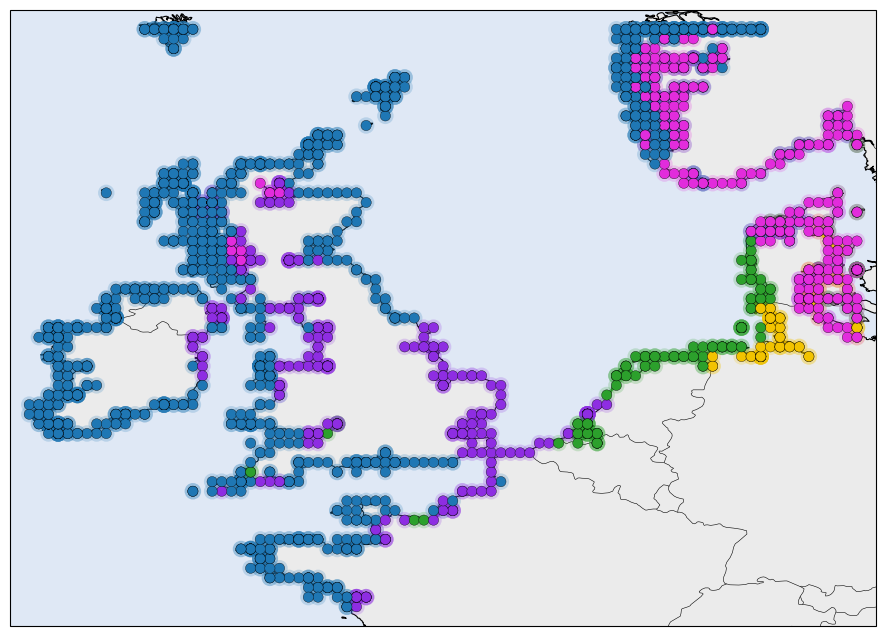

In [40]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import cartopy.crs as ccrs
import cartopy.feature as cfeature

pred_coastline = best_model.predict(X_coastline_model)
stats_df_test_pred = stats_df_test.copy()
stats_df_test_pred["pred_cluster"] = pred_coastline

# --- setup ---
cluster_col = "pred_cluster"
plot_df = stats_df_test_pred.dropna(subset=["lat", "lon", cluster_col]).copy()
plot_df[cluster_col] = plot_df[cluster_col].astype(int)

clusters = np.sort(plot_df[cluster_col].unique())
n_clusters = len(clusters)+1

base_colors = [
    "#8E2DE2",  # purple
    "#1F77B4",  # blue
    "#2CA02C",  # green
    "#F2C300",  # yellow
    "#E64B35",  # orange-red
    "#e22cdc"
]
colors = base_colors[:n_clusters]
cmap = mcolors.ListedColormap(colors)

fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, facecolor="0.92")
ax.add_feature(cfeature.OCEAN, facecolor="#dfe8f5")
ax.coastlines(resolution="10m", linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linewidth=0.4)

ax.set_extent([
    plot_df["lon"].min() - 0.5,
    plot_df["lon"].max() + 0.5,
    plot_df["lat"].min() - 0.5,
    plot_df["lat"].max() + 0.5
], crs=ccrs.PlateCarree())

# --- soft halo underneath ---
ax.scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df[cluster_col],
    s=140,
    alpha=0.20,
    cmap=cmap,
    linewidth=0,
    transform=ccrs.PlateCarree(),
    zorder=2
)

# --- main points ---
sc = ax.scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df[cluster_col],
    s=55,
    cmap=cmap,
    edgecolor="k",
    linewidth=0.25,
    transform=ccrs.PlateCarree(),
    zorder=3
)

# --- optional: connect only short local segments within each cluster ---
# This avoids long bogus coast-crossing lines.
for cluster in clusters:
    subset = plot_df.loc[plot_df[cluster_col] == cluster, ["lon", "lat"]].copy()

    coords = subset[["lon", "lat"]].to_numpy()
    if len(coords) < 2:
        continue

    # naive local linking: sort by latitude then longitude as a rough path
    subset = subset.sort_values(["lat", "lon"]).reset_index(drop=True)

    # only draw segment if adjacent points are close enough
    max_dist = 0.4  # tune to your station spacing
    for i in range(len(subset) - 1):
        x1, y1 = subset.loc[i, ["lon", "lat"]]
        x2, y2 = subset.loc[i + 1, ["lon", "lat"]]
        dist = np.hypot(x2 - x1, y2 - y1)

        if dist <= max_dist:
            ax.plot(
                [x1, x2], [y1, y2],
                color=colors[int(cluster)],
                linewidth=2.0,
                alpha=0.8,
                transform=ccrs.PlateCarree(),
                zorder=2.5
            )

# --- legend instead of only colorbar ---
handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {clusters[i]}")
    for i in range(n_clusters)
]
ax.legend(handles=handles, loc="lower left", title="Regime", frameon=True)

plt.colorbar(sc, ax=ax, shrink=0.75, pad=0.03, label=cluster_col)
plt.title("Predicted coastal surge regimes")
plt.show()

# NO Temperature (dominating one)

In [41]:
patterns = ["std", "t2m_am_max", "t2m_am_mean", "mwp"]

cols_to_drop = [
    col for col in X.columns
    if any(p in col.lower() for p in patterns)
]
X_noT = X.drop(columns=cols_to_drop, errors="ignore")
X_coastline_noT = X_coastline.drop(columns=cols_to_drop, errors="ignore")
stats_df_test_noT = stats_df_test.drop(columns=cols_to_drop, errors="ignore")

In [42]:
import numpy as np
import pandas as pd
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
num_cols = X_noT.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = X_noT.select_dtypes(exclude=[np.number]).columns.tolist()

numeric_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="mean")),
    ("scaler", StandardScaler())
])

categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", OneHotEncoder(handle_unknown="ignore"))
])

preprocessor = ColumnTransformer([
    ("num", numeric_pipeline, num_cols),
    ("cat", categorical_pipeline, cat_cols)
])

from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier

pipe = Pipeline([
    ("preprocess", preprocessor),
    ("smote", SMOTE(random_state=0, k_neighbors=1)),  # safer
    ("rf", RandomForestClassifier(random_state=0, n_jobs=-1))
])
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_noT, y, test_size=0.25, random_state=0, stratify=y
)
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV

param_dist = {
    "smote__k_neighbors": [1, 2],
    "rf__n_estimators": [300],
    "rf__max_depth": [30],
    "rf__min_samples_split": [2,],
    "rf__min_samples_leaf": [ 4],
    "rf__max_features": ["sqrt"],
    "rf__class_weight": [None, "balanced", "balanced_subsample"]
}

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)

search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_dist,
    n_iter=40,
    scoring="precision_weighted",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=0,
    refit=True,
    error_score="raise"
)
search.fit(X_train, y_train)

#print("Best params:")
#print(search.best_params_)
#print("Best CV score:", search.best_score_)

best_model = search.best_estimator_
pred = best_model.predict(X_test)

from sklearn.metrics import classification_report, accuracy_score
##print("Test accuracy:", accuracy_score(y_test, pred))
#print(classification_report(y_test, pred))

Fitting 3 folds for each of 6 candidates, totalling 18 fits


/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 6 is smaller than n_iter=40. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_de

In [43]:
best_model = search.best_estimator_
pred = best_model.predict(X_test)
print("Test accuracy:", accuracy_score(y_test, pred))

Test accuracy: 0.828125


/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'
 'mwd_slope_mpm_0.25x0.25' 'mwd_slope_deg_0.25x0.25'
 'mwd_local_slope_mean_mpm_0.25x0.25

In [44]:
X_coastline_noT =  X_coastline.copy().drop(columns={"t2m_am_max", "t2m_am_std", "t2m_am_mean"})
stats_df_test_noT =  stats_df_test.copy().drop(columns={"t2m_am_max", "t2m_am_std", "t2m_am_mean"})

Test accuracy: 0.8281
              precision    recall  f1-score   support

         0.0       0.86      0.71      0.77        17
         1.0       0.90      0.96      0.93        27
         2.0       0.67      0.77      0.71        13
         3.0       0.80      1.00      0.89         4
         5.0       1.00      0.33      0.50         3

    accuracy                           0.83        64
   macro avg       0.84      0.75      0.76        64
weighted avg       0.84      0.83      0.82        64



/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'
 'mwd_slope_mpm_0.25x0.25' 'mwd_slope_deg_0.25x0.25'
 'mwd_local_slope_mean_mpm_0.25x0.25

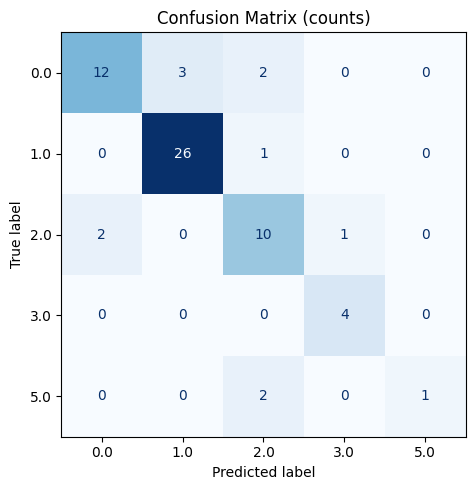

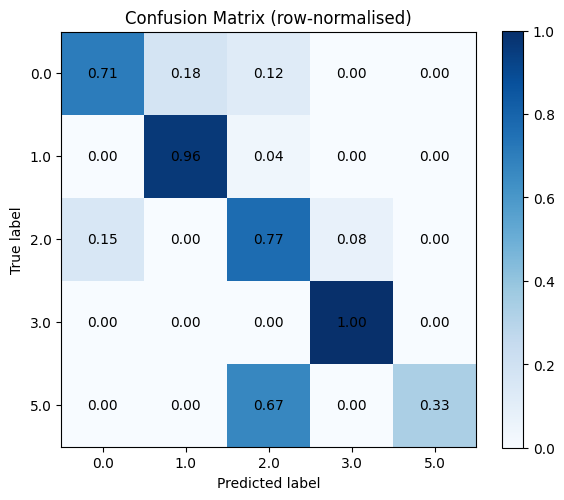

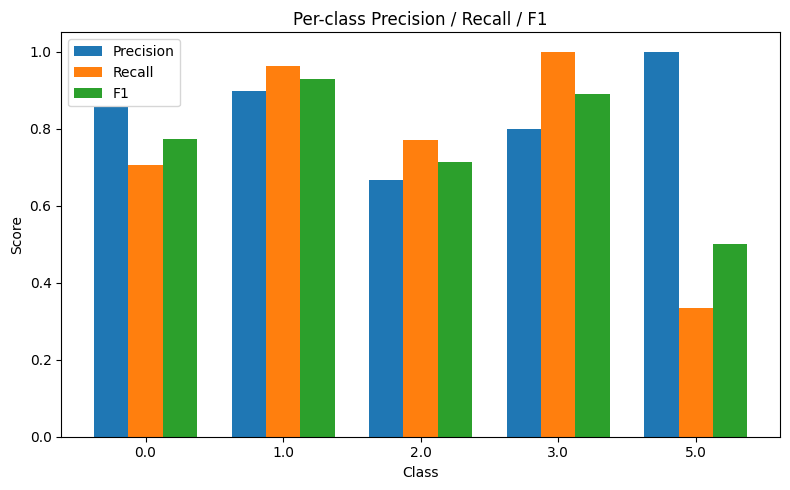

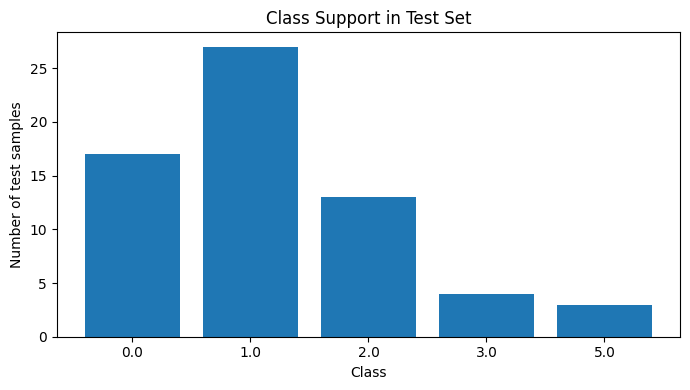

Top confusion pairs:
   true_class  pred_class  count
0         0.0         1.0      3
1         0.0         2.0      2
2         2.0         0.0      2
3         5.0         2.0      2
4         1.0         2.0      1
5         2.0         3.0      1


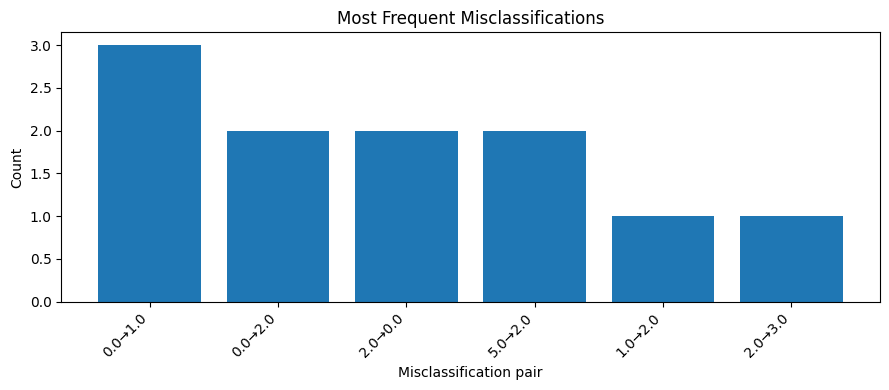

/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'
 'mwd_slope_mpm_0.25x0.25' 'mwd_slope_deg_0.25x0.25'
 'mwd_local_slope_mean_mpm_0.25x0.25

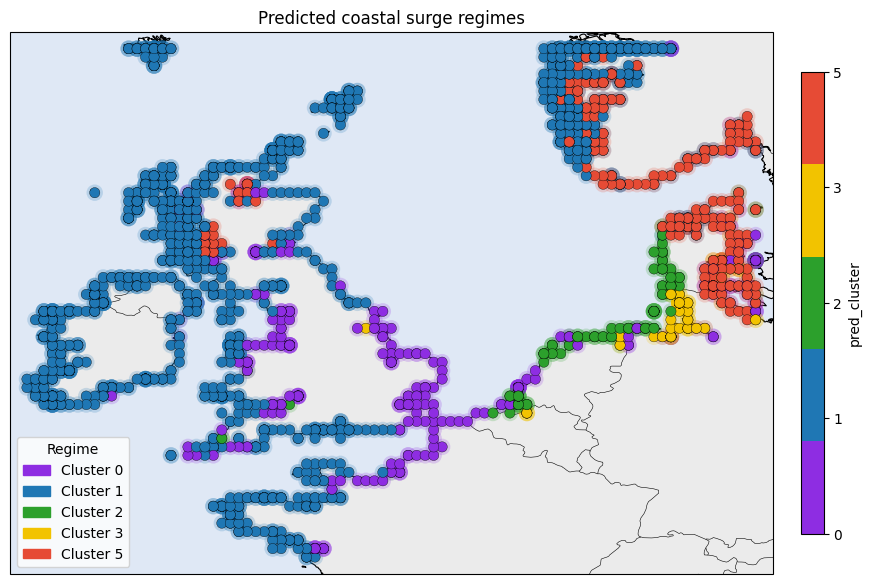

In [48]:
results = evaluate_model_and_map(
    model=best_model,
    X_test=X_test,
    y_test=y_test,
    X_coastline=X_coastline_noT,
    stats_df_test=stats_df_test_noT,
    X_train_reference=X_noT
)

In [49]:
import warnings
warnings.filterwarnings("ignore")

PermutationExplainer explainer: 65it [00:40,  1.23it/s]                        


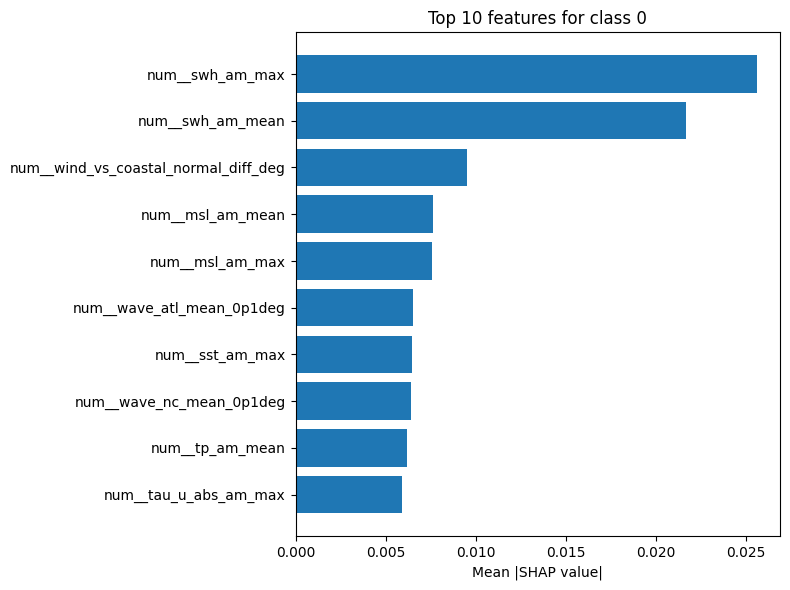

In [50]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# Split pipeline
preprocessor = best_model.named_steps["preprocess"]
model = best_model.named_steps["rf"]

# Transform data
X_train_trans = preprocessor.transform(X_train)
X_test_trans = preprocessor.transform(X_test)

# Convert sparse matrices if needed
if hasattr(X_train_trans, "toarray"):
    X_train_trans = X_train_trans.toarray()
if hasattr(X_test_trans, "toarray"):
    X_test_trans = X_test_trans.toarray()

# Feature names after preprocessing
feature_names = preprocessor.get_feature_names_out()

# Background sample
rng = np.random.default_rng(42)
bg_idx = rng.choice(X_train_trans.shape[0], size=min(100, X_train_trans.shape[0]), replace=False)
X_background = X_train_trans[bg_idx]

# Explain predicted probabilities of the final classifier
explainer = shap.Explainer(model.predict_proba, X_background)
shap_values = explainer(X_test_trans, max_evals=1000)

class_idx = 0

importance_class = np.abs(shap_values.values[:, :, class_idx]).mean(axis=0)

top_n = 10
idx = np.argsort(importance_class)[-top_n:]
idx = idx[np.argsort(importance_class[idx])]

plt.figure(figsize=(8, 6))
plt.barh(range(len(idx)), importance_class[idx])
plt.yticks(range(len(idx)), feature_names[idx])
plt.xlabel("Mean |SHAP value|")
plt.title(f"Top {top_n} features for class {class_idx}")
plt.tight_layout()
plt.show()

In [51]:
feature_names = preprocessor.get_feature_names_out()

In [ ]:
#importance_class = np.abs(shap_values.values[:, :, :]).mean(axis=0)
#importance_class = importance_class.mean(axis=1)

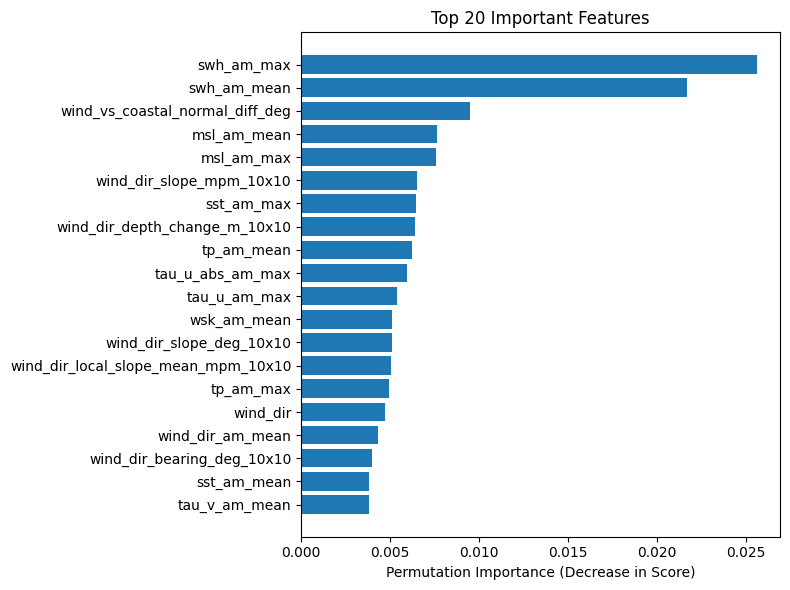

In [52]:
import numpy as np
import matplotlib.pyplot as plt

feature_names = np.array(X_test.columns)

importances_mean = importance_class
# Get top 20 features (by importance, not absolute)
top_n = 20
indices = np.argsort(importances_mean)[-top_n:]

# Sort those top features for clean plotting
indices = indices[np.argsort(importances_mean[indices])]

plt.figure(figsize=(8, 6))
plt.barh(range(top_n), importances_mean[indices],)
       #  xerr=importances_std[indices])
plt.yticks(range(top_n), feature_names[indices])
plt.xlabel("Permutation Importance (Decrease in Score)")
plt.title("Top 20 Important Features")
plt.tight_layout()
plt.show()

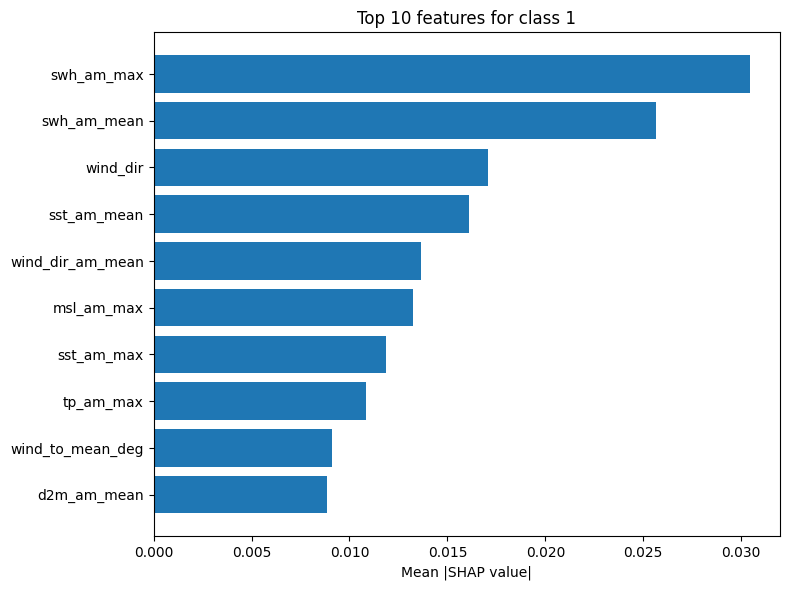

In [53]:
class_idx = 1

importance_class = np.abs(shap_values.values[:, :, class_idx]).mean(axis=0)

top_n = 10
idx = np.argsort(importance_class)[-top_n:]
idx = idx[np.argsort(importance_class[idx])]

plt.figure(figsize=(8, 6))
plt.barh(range(len(idx)), importance_class[idx])
plt.yticks(range(len(idx)), feature_names[idx])
plt.xlabel("Mean |SHAP value|")
plt.title(f"Top {top_n} features for class {class_idx}")
plt.tight_layout()
plt.show()

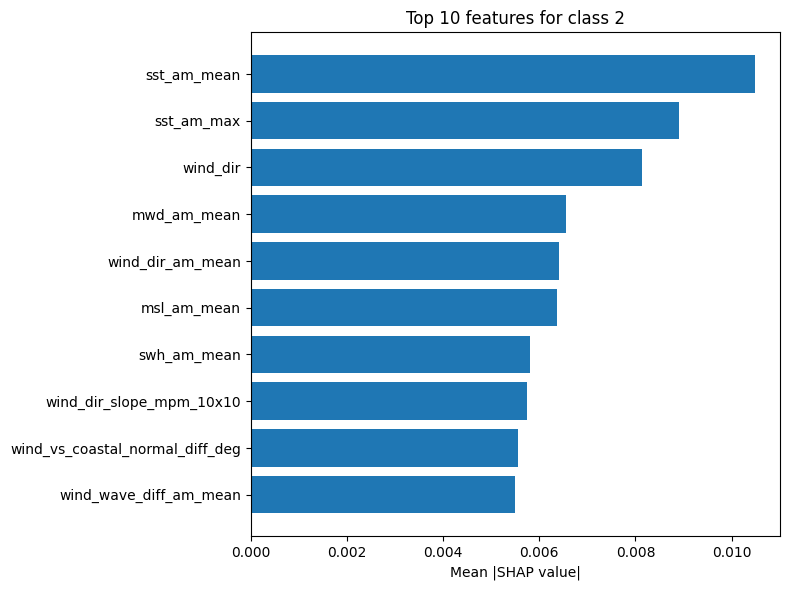

In [54]:
class_idx = 2

importance_class = np.abs(shap_values.values[:, :, class_idx]).mean(axis=0)

top_n = 10
idx = np.argsort(importance_class)[-top_n:]
idx = idx[np.argsort(importance_class[idx])]

plt.figure(figsize=(8, 6))
plt.barh(range(len(idx)), importance_class[idx])
plt.yticks(range(len(idx)), feature_names[idx])
plt.xlabel("Mean |SHAP value|")
plt.title(f"Top {top_n} features for class {class_idx}")
plt.tight_layout()
plt.show()

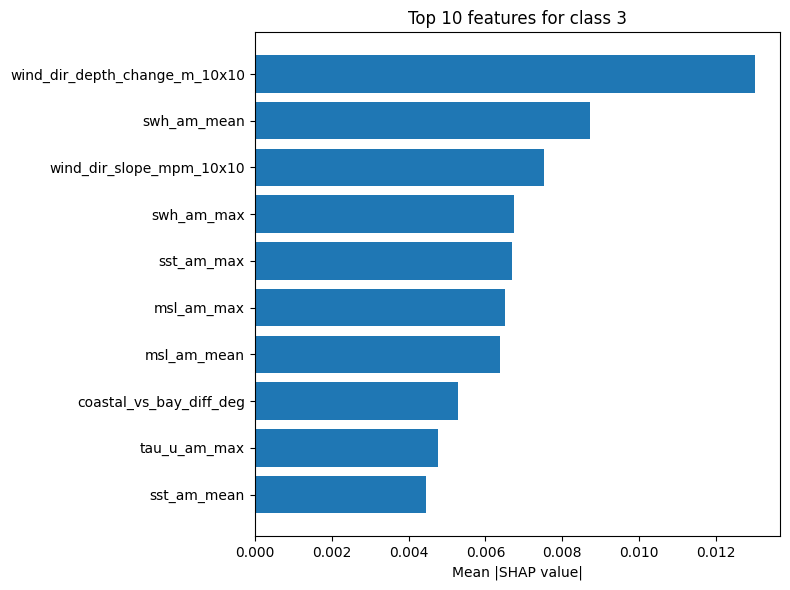

In [55]:
class_idx = 3

importance_class = np.abs(shap_values.values[:, :, class_idx]).mean(axis=0)

top_n = 10
idx = np.argsort(importance_class)[-top_n:]
idx = idx[np.argsort(importance_class[idx])]

plt.figure(figsize=(8, 6))
plt.barh(range(len(idx)), importance_class[idx])
plt.yticks(range(len(idx)), feature_names[idx])
plt.xlabel("Mean |SHAP value|")
plt.title(f"Top {top_n} features for class {class_idx}")
plt.tight_layout()
plt.show()

# protect at all costs

In [131]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE

X = X.copy()
X = X.replace([np.inf, -np.inf], np.nan)

num_cols = X.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = X.select_dtypes(exclude=[np.number]).columns.tolist()

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=0, stratify=y
)

preprocessor = ColumnTransformer([
    (
        "num",
        Pipeline([
            ("imputer", SimpleImputer(strategy="mean")),
            ("scaler", StandardScaler()),
        ]),
        num_cols,
    ),
    (
        "cat",
        Pipeline([
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("onehot", OneHotEncoder(handle_unknown="ignore")),
        ]),
        cat_cols,
    ),
])

pipe_pca = Pipeline([
    ("preprocess", preprocessor),
    ("smote", SMOTE(random_state=0, k_neighbors=1)),
    ("pca", PCA(random_state=0)),
    ("rf", RandomForestClassifier(random_state=0, n_jobs=-1)),
])

param_dist_pca = {
    "smote__k_neighbors": [1, 2],
    "pca__n_components": [0.80, 0.90, 0.95, None],
    "rf__n_estimators": [300, 500, 800, 1200],
    "rf__max_depth": [None, 10, 20, 30],
    "rf__min_samples_split": [2, 5, 10],
    "rf__min_samples_leaf": [1, 2, 4],
    "rf__max_features": ["sqrt", "log2", 0.5],
    "rf__class_weight": [None, "balanced", "balanced_subsample"],
}

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)

search_pca = RandomizedSearchCV(
    estimator=pipe_pca,
    param_distributions=param_dist_pca,
    n_iter=40,
    scoring="precision_weighted",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=0,
    refit=True,
    error_score="raise",
)

search_pca.fit(X_train, y_train)

print(search_pca.best_params_)
print(search_pca.best_score_)

best_model_pca = search_pca.best_estimator_
pred_pca = best_model_pca.predict(X_test)

print("Test accuracy:", accuracy_score(y_test, pred_pca))
print(classification_report(y_test, pred_pca))

Fitting 3 folds for each of 40 candidates, totalling 120 fits


/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

{'smote__k_neighbors': 1, 'rf__n_estimators': 300, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'log2', 'rf__max_depth': 30, 'rf__class_weight': 'balanced_subsample', 'pca__n_components': 0.9}
0.7857593405657113
Test accuracy: 0.746031746031746
              precision    recall  f1-score   support

         1.0       0.86      0.77      0.81        31
         2.0       0.75      0.75      0.75         4
         3.0       0.69      0.72      0.71        25
         4.0       0.40      0.67      0.50         3

    accuracy                           0.75        63
   macro avg       0.67      0.73      0.69        63
weighted avg       0.76      0.75      0.75        63



/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
    precision_recall_fscore_support,
    accuracy_score,
)

import cartopy.crs as ccrs
import cartopy.feature as cfeature


def evaluate_model_and_map(
    model,
    X_test,
    y_test,
    X_coastline,
    stats_df_test,
    X_train_reference,
    lat_col="lat",
    lon_col="lon",
    cluster_col="pred_cluster",
    map_title="Predicted coastal surge regimes",
    max_link_dist=0.4,
    base_colors=None,
    figsize_cm=(6, 5),
    figsize_metrics=(8, 5),
    figsize_support=(7, 4),
    figsize_pairs=(9, 4),
    figsize_map=(12, 8),
    print_report=True,
):
    """
    Evaluate a fitted classification model on X_test/y_test and map predictions on X_coastline.

    Parameters
    ----------
    model : fitted estimator or pipeline
        Must support .predict().
    X_test : pd.DataFrame or array-like
    y_test : array-like
    X_coastline : pd.DataFrame
        New data to predict and map.
    stats_df_test : pd.DataFrame
        Must contain lat/lon columns for mapping.
    X_train_reference : pd.DataFrame
        Training feature frame used to define the expected input columns.
    lat_col, lon_col : str
        Coordinate columns in stats_df_test.
    cluster_col : str
        Name of output prediction column.
    map_title : str
    max_link_dist : float
        Max Euclidean distance in degrees for short local line segments.
    base_colors : list[str] or None
        Optional fixed color list.
    """

    # -----------------------------
    # 1) Test-set prediction
    # -----------------------------
    pred = model.predict(X_test)

    labels = np.sort(np.unique(y_test))

    print(f"Test accuracy: {accuracy_score(y_test, pred):.4f}")
    if print_report:
        print(classification_report(y_test, pred))

    # -----------------------------
    # 2) Raw confusion matrix
    # -----------------------------
    fig, ax = plt.subplots(figsize=figsize_cm)
    ConfusionMatrixDisplay.from_predictions(
        y_test,
        pred,
        labels=labels,
        cmap="Blues",
        ax=ax,
        colorbar=False
    )
    ax.set_title("Confusion Matrix (counts)")
    plt.tight_layout()
    plt.show()

    # -----------------------------
    # 3) Row-normalized confusion matrix
    # -----------------------------
    cm = confusion_matrix(y_test, pred, labels=labels)
    row_sums = cm.sum(axis=1, keepdims=True)
    cm_norm = np.divide(cm, row_sums, out=np.zeros_like(cm, dtype=float), where=row_sums != 0)

    fig, ax = plt.subplots(figsize=figsize_cm)
    im = ax.imshow(cm_norm, interpolation="nearest", cmap="Blues")
    ax.set_title("Confusion Matrix (row-normalised)")
    ax.set_xlabel("Predicted label")
    ax.set_ylabel("True label")
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels)
    ax.set_yticklabels(labels)

    for i in range(cm_norm.shape[0]):
        for j in range(cm_norm.shape[1]):
            ax.text(j, i, f"{cm_norm[i, j]:.2f}", ha="center", va="center")

    plt.colorbar(im, ax=ax)
    plt.tight_layout()
    plt.show()

    # -----------------------------
    # 4) Per-class metrics
    # -----------------------------
    prec, rec, f1, support = precision_recall_fscore_support(
        y_test, pred, labels=labels, zero_division=0
    )

    metrics_df = pd.DataFrame({
        "class": labels,
        "precision": prec,
        "recall": rec,
        "f1": f1,
        "support": support
    })

    x = np.arange(len(labels))
    w = 0.25

    fig, ax = plt.subplots(figsize=figsize_metrics)
    ax.bar(x - w, metrics_df["precision"], width=w, label="Precision")
    ax.bar(x,     metrics_df["recall"],    width=w, label="Recall")
    ax.bar(x + w, metrics_df["f1"],        width=w, label="F1")
    ax.set_xticks(x)
    ax.set_xticklabels(metrics_df["class"])
    ax.set_ylim(0, 1.05)
    ax.set_xlabel("Class")
    ax.set_ylabel("Score")
    ax.set_title("Per-class Precision / Recall / F1")
    ax.legend()
    plt.tight_layout()
    plt.show()

    # -----------------------------
    # 5) Support by class
    # -----------------------------
    fig, ax = plt.subplots(figsize=figsize_support)
    ax.bar(metrics_df["class"].astype(str), metrics_df["support"])
    ax.set_xlabel("Class")
    ax.set_ylabel("Number of test samples")
    ax.set_title("Class Support in Test Set")
    plt.tight_layout()
    plt.show()

    # -----------------------------
    # 6) Top confusion pairs
    # -----------------------------
    cm_offdiag = cm.copy()
    np.fill_diagonal(cm_offdiag, 0)

    pairs = []
    for i, true_cls in enumerate(labels):
        for j, pred_cls in enumerate(labels):
            if i != j and cm_offdiag[i, j] > 0:
                pairs.append((true_cls, pred_cls, cm_offdiag[i, j]))

    pairs = sorted(pairs, key=lambda x: x[2], reverse=True)
    pairs_df = pd.DataFrame(pairs, columns=["true_class", "pred_class", "count"])

    print("Top confusion pairs:")
    print(pairs_df.head(10))

    top_n = min(10, len(pairs_df))
    if top_n > 0:
        fig, ax = plt.subplots(figsize=figsize_pairs)
        labels_pairs = [
            f"{t}→{p}"
            for t, p in zip(pairs_df["true_class"][:top_n], pairs_df["pred_class"][:top_n])
        ]
        ax.bar(labels_pairs, pairs_df["count"][:top_n])
        ax.set_xlabel("Misclassification pair")
        ax.set_ylabel("Count")
        ax.set_title("Most Frequent Misclassifications")
        plt.xticks(rotation=45, ha="right")
        plt.tight_layout()
        plt.show()

    # -----------------------------
    # 7) Coastline prediction
    # -----------------------------
    X_coastline_model = X_coastline.copy()

    # replace inf only in numeric columns
    num_cols = X_coastline_model.select_dtypes(include=[np.number]).columns
    X_coastline_model[num_cols] = X_coastline_model[num_cols].replace([np.inf, -np.inf], np.nan)

    # align to training schema
    X_coastline_model = X_coastline_model.reindex(columns=X_train_reference.columns)

    pred_coastline = model.predict(X_coastline_model)

    stats_df_test_pred = stats_df_test.copy()
    stats_df_test_pred[cluster_col] = pred_coastline

    # -----------------------------
    # 8) Map predictions
    # -----------------------------
    plot_df = stats_df_test_pred.dropna(subset=[lat_col, lon_col, cluster_col]).copy()
    plot_df[cluster_col] = plot_df[cluster_col].astype(int)

    clusters = np.sort(plot_df[cluster_col].unique())
    n_clusters = len(clusters)

    if base_colors is None:
        base_colors = [
            "#8E2DE2",  # purple
            "#1F77B4",  # blue
            "#2CA02C",  # green
            "#F2C300",  # yellow
            "#E64B35",  # orange-red
            "#17BECF",  # cyan
            "#9467BD",  # violet
            "#8C564B",  # brown
            "#7F7F7F",  # gray
            "#BCBD22",  # olive
        ]

    if n_clusters > len(base_colors):
        raise ValueError(f"Need {n_clusters} colors but only have {len(base_colors)}.")

    color_map = dict(zip(clusters, base_colors[:n_clusters]))
    cmap = mcolors.ListedColormap([color_map[c] for c in clusters])

    fig = plt.figure(figsize=figsize_map)
    ax = plt.axes(projection=ccrs.PlateCarree())

    ax.add_feature(cfeature.LAND, facecolor="0.92")
    ax.add_feature(cfeature.OCEAN, facecolor="#dfe8f5")
    ax.coastlines(resolution="10m", linewidth=0.8)
    ax.add_feature(cfeature.BORDERS, linewidth=0.4)

    ax.set_extent([
        plot_df[lon_col].min() - 0.5,
        plot_df[lon_col].max() + 0.5,
        plot_df[lat_col].min() - 0.5,
        plot_df[lat_col].max() + 0.5
    ], crs=ccrs.PlateCarree())

    # map actual class values to 0..n-1 for stable colormap indexing
    cluster_to_idx = {c: i for i, c in enumerate(clusters)}
    plot_df["_cluster_idx"] = plot_df[cluster_col].map(cluster_to_idx)

    ax.scatter(
        plot_df[lon_col],
        plot_df[lat_col],
        c=plot_df["_cluster_idx"],
        s=140,
        alpha=0.20,
        cmap=cmap,
        linewidth=0,
        transform=ccrs.PlateCarree(),
        zorder=2
    )

    sc = ax.scatter(
        plot_df[lon_col],
        plot_df[lat_col],
        c=plot_df["_cluster_idx"],
        s=55,
        cmap=cmap,
        edgecolor="k",
        linewidth=0.25,
        transform=ccrs.PlateCarree(),
        zorder=3
    )

    for cluster in clusters:
        subset = plot_df.loc[plot_df[cluster_col] == cluster, [lon_col, lat_col]].copy()
        if len(subset) < 2:
            continue

        subset = subset.sort_values([lat_col, lon_col]).reset_index(drop=True)

        for i in range(len(subset) - 1):
            x1, y1 = subset.loc[i, [lon_col, lat_col]]
            x2, y2 = subset.loc[i + 1, [lon_col, lat_col]]
            dist = np.hypot(x2 - x1, y2 - y1)

            if dist <= max_link_dist:
                ax.plot(
                    [x1, x2], [y1, y2],
                    color=color_map[cluster],
                    linewidth=2.0,
                    alpha=0.8,
                    transform=ccrs.PlateCarree(),
                    zorder=2.5
                )

    handles = [
        mpatches.Patch(color=color_map[c], label=f"Cluster {c}")
        for c in clusters
    ]
    ax.legend(handles=handles, loc="lower left", title="Regime", frameon=True)

    cbar = plt.colorbar(sc, ax=ax, shrink=0.75, pad=0.03)
    cbar.set_ticks(range(n_clusters))
    cbar.set_ticklabels(clusters)
    cbar.set_label(cluster_col)

    plt.title(map_title)
    plt.show()

    return {
        "pred_test": pred,
        "accuracy": accuracy_score(y_test, pred),
        "classification_report": classification_report(y_test, pred, output_dict=False),
        "metrics_df": metrics_df,
        "pairs_df": pairs_df,
        "stats_df_test_pred": stats_df_test_pred,
        "pred_coastline": pred_coastline,
        "labels": labels,
        "clusters": clusters,
    }

In [47]:
results = evaluate_model_and_map(
    model=best_model_pca,
    X_test=X_test,
    y_test=y_test,
    X_coastline=X_coastline,
    stats_df_test=stats_df_test,
    X_train_reference=X
)

NameError: name 'best_model_pca' is not defined

Fitting 3 folds for each of 20 candidates, totalling 60 fits


/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

=== Logistic Regression ===
{'smote__k_neighbors': 1, 'lr__solver': 'lbfgs', 'lr__class_weight': None, 'lr__C': 0.1}
0.7787482526087685
Test accuracy: 0.7619
              precision    recall  f1-score   support

         1.0       0.95      0.68      0.79        31
         2.0       1.00      0.75      0.86         4
         3.0       0.71      0.88      0.79        25
         4.0       0.29      0.67      0.40         3

    accuracy                           0.76        63
   macro avg       0.74      0.74      0.71        63
weighted avg       0.83      0.76      0.78        63



/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

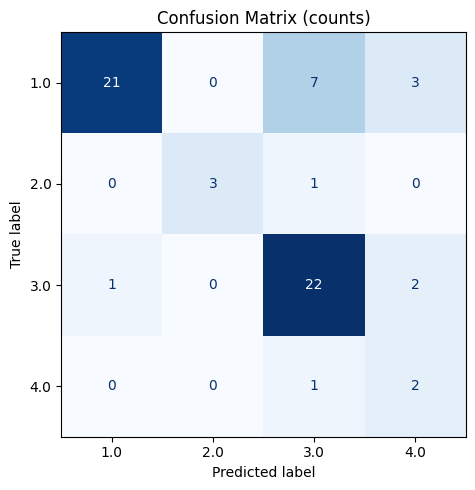

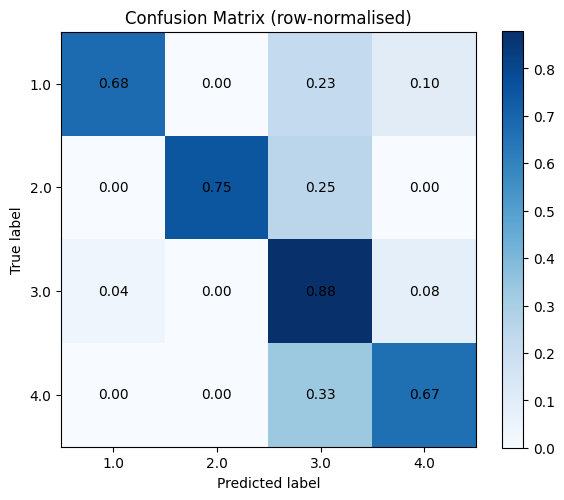

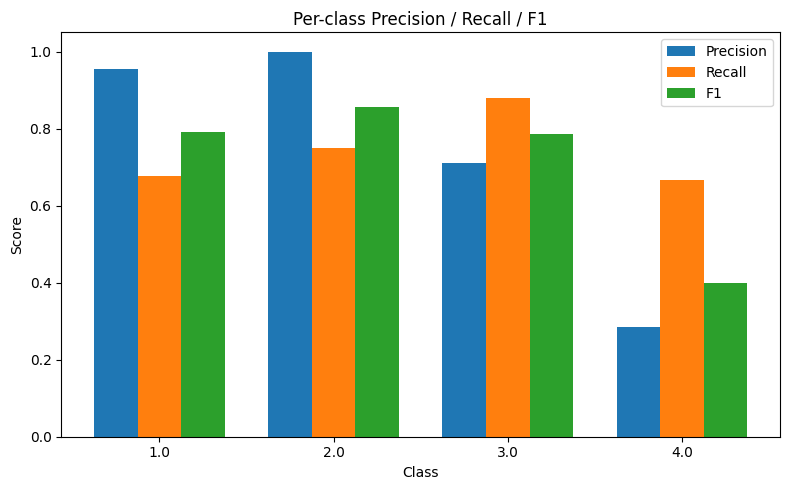

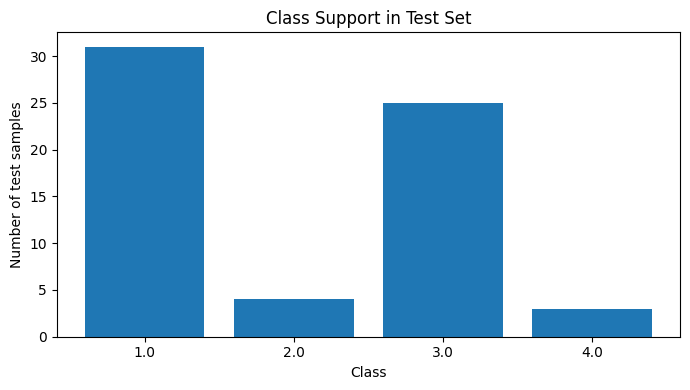

Top confusion pairs:
   true_class  pred_class  count
0         1.0         3.0      7
1         1.0         4.0      3
2         3.0         4.0      2
3         2.0         3.0      1
4         3.0         1.0      1
5         4.0         3.0      1


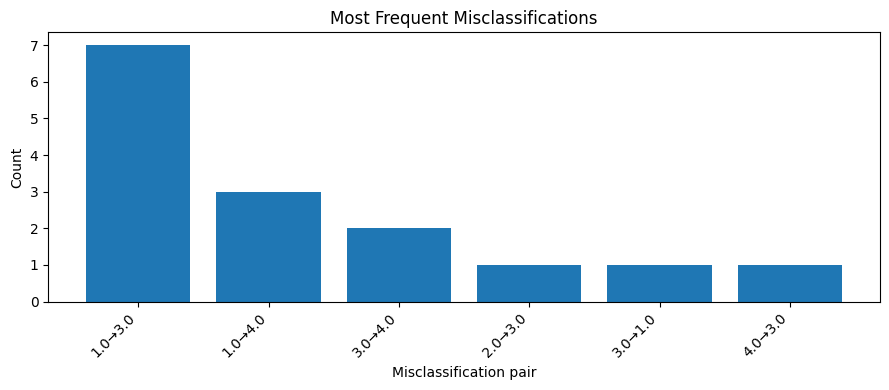

/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

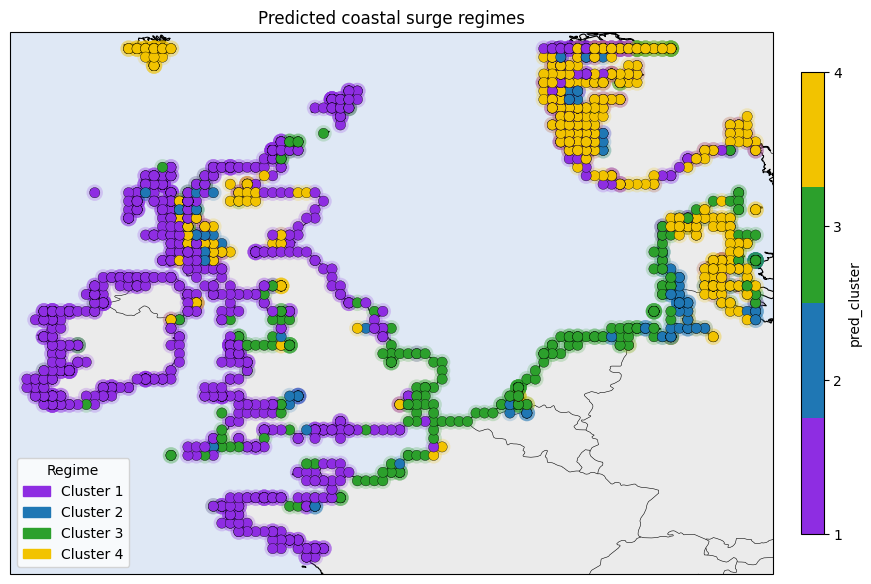

In [139]:
from sklearn.linear_model import LogisticRegression

pipe_lr = Pipeline([
    ("preprocess", preprocessor),
    ("smote", SMOTE(random_state=0, k_neighbors=1)),
    ("lr", LogisticRegression(max_iter=5000, random_state=0)),
])

param_dist_lr = {
    "smote__k_neighbors": [1, 2],
    "lr__C": [0.01, 0.1, 1, 10, 100],
    "lr__class_weight": [None, "balanced"],
    "lr__solver": ["lbfgs", "saga"],
}

search_lr = RandomizedSearchCV(
    estimator=pipe_lr,
    param_distributions=param_dist_lr,
    n_iter=20,
    scoring="precision_weighted",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=0,
    refit=True,
    error_score="raise",
)

search_lr.fit(X_train, y_train)

print("=== Logistic Regression ===")
print(search_lr.best_params_)
print(search_lr.best_score_)

best_model_lr = search_lr.best_estimator_
pred_lr = best_model_lr.predict(X_test)

results = evaluate_model_and_map(
    model=best_model_lr,
    X_test=X_test,
    y_test=y_test,
    X_coastline=X_coastline,
    stats_df_test=stats_df_test,
    X_train_reference=X
)


# EXTRATREES

Fitting 3 folds for each of 30 candidates, totalling 90 fits


/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'
 'mwd_slope_mpm_0.25x0.25' 'mwd_slope_deg_0.25x0.25'
 'mwd_local_slope_mean_mpm_0.25x0.25

=== ExtraTrees ===
{'smote__k_neighbors': 1, 'et__n_estimators': 1200, 'et__min_samples_split': 10, 'et__min_samples_leaf': 4, 'et__max_features': 0.5, 'et__max_depth': None, 'et__class_weight': 'balanced_subsample'}
0.7646914799372557
Test accuracy: 0.8750
              precision    recall  f1-score   support

         0.0       0.93      0.76      0.84        17
         1.0       0.90      0.96      0.93        27
         2.0       0.75      0.92      0.83        13
         3.0       1.00      1.00      1.00         4
         5.0       1.00      0.33      0.50         3

    accuracy                           0.88        64
   macro avg       0.92      0.80      0.82        64
weighted avg       0.89      0.88      0.87        64



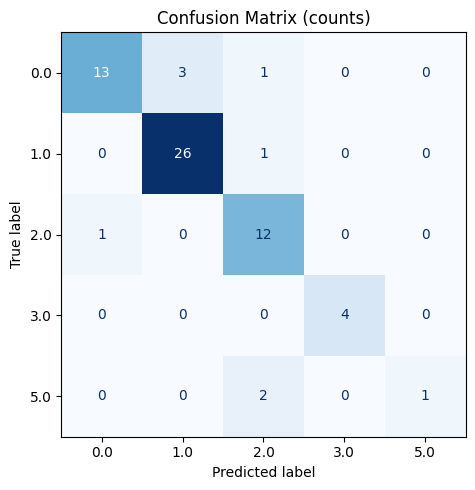

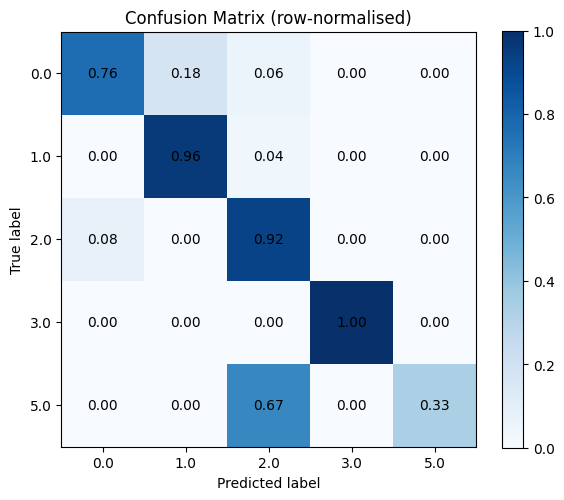

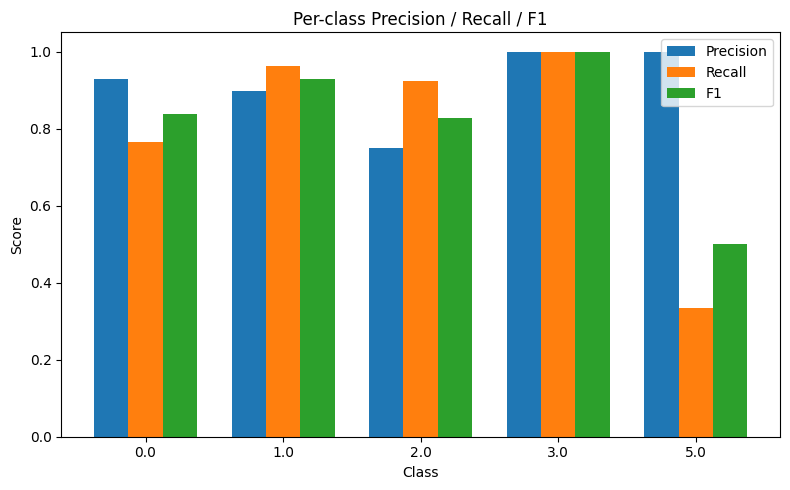

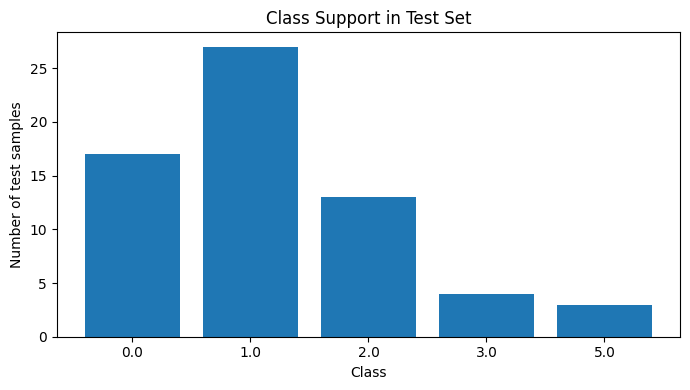

Top confusion pairs:
   true_class  pred_class  count
0         0.0         1.0      3
1         5.0         2.0      2
2         0.0         2.0      1
3         1.0         2.0      1
4         2.0         0.0      1


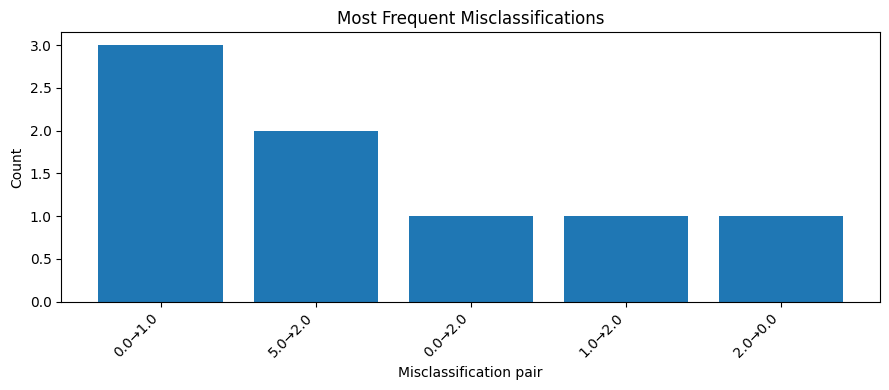

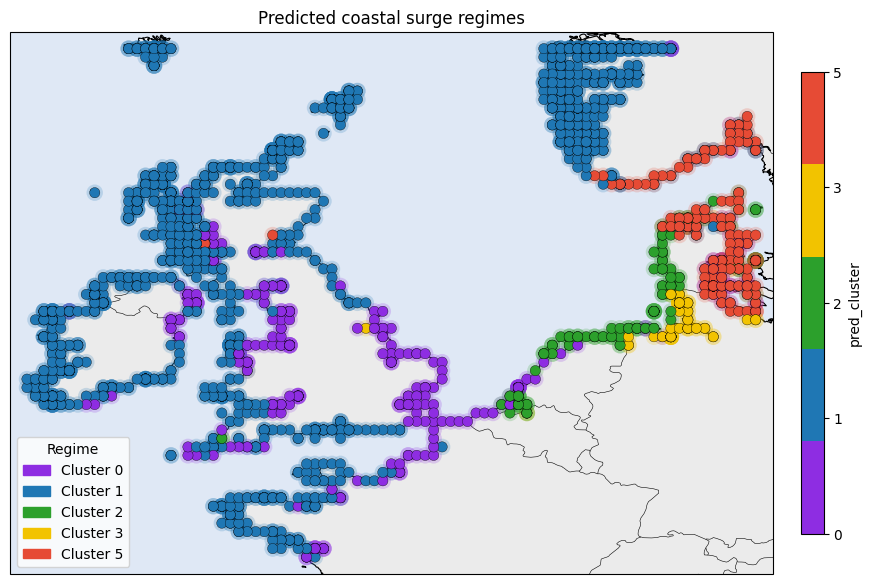

In [56]:
from sklearn.ensemble import ExtraTreesClassifier

pipe_et = Pipeline([
    ("preprocess", preprocessor),
    ("smote", SMOTE(random_state=0, k_neighbors=1)),
    ("et", ExtraTreesClassifier(random_state=0, n_jobs=-1)),
])

param_dist_et = {
    "smote__k_neighbors": [1, 2],
    "et__n_estimators": [300, 500, 800, 1200],
    "et__max_depth": [None, 10, 20, 30],
    "et__min_samples_split": [2, 5, 10],
    "et__min_samples_leaf": [1, 2, 4],
    "et__max_features": ["sqrt", "log2", 0.5],
    "et__class_weight": [None, "balanced", "balanced_subsample"],
}

search_et = RandomizedSearchCV(
    estimator=pipe_et,
    param_distributions=param_dist_et,
    n_iter=30,
    scoring="precision_weighted",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=0,
    refit=True,
    error_score="raise",
)

search_et.fit(X_train, y_train)

print("=== ExtraTrees ===")
print(search_et.best_params_)
print(search_et.best_score_)

best_model_et = search_et.best_estimator_
pred_et = best_model_et.predict(X_test)

results = evaluate_model_and_map(
    model=best_model_et ,
    X_test=X_test,
    y_test=y_test,
    X_coastline=X_coastline,
    stats_df_test=stats_df_test,
    X_train_reference=X
)

# HISTBOOSTING

Fitting 3 folds for each of 25 candidates, totalling 75 fits


/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

=== HistGradientBoosting ===
{'smote__k_neighbors': 1, 'hgb__min_samples_leaf': 30, 'hgb__max_leaf_nodes': 15, 'hgb__max_depth': 20, 'hgb__learning_rate': 0.03, 'hgb__l2_regularization': 0.01}
0.80959985538724
Test accuracy: 0.8413
              precision    recall  f1-score   support

         1.0       0.93      0.81      0.86        31
         2.0       0.75      0.75      0.75         4
         3.0       0.82      0.92      0.87        25
         4.0       0.50      0.67      0.57         3

    accuracy                           0.84        63
   macro avg       0.75      0.79      0.76        63
weighted avg       0.85      0.84      0.84        63



/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

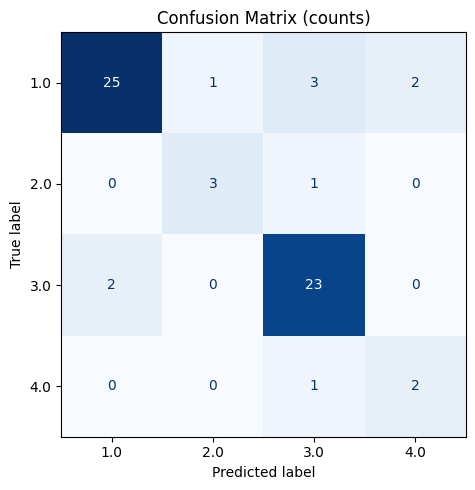

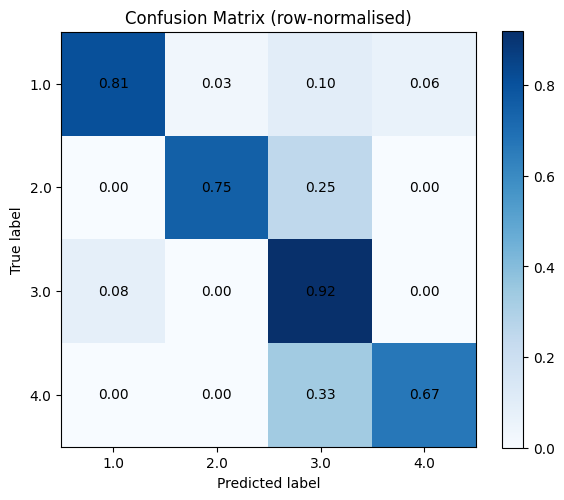

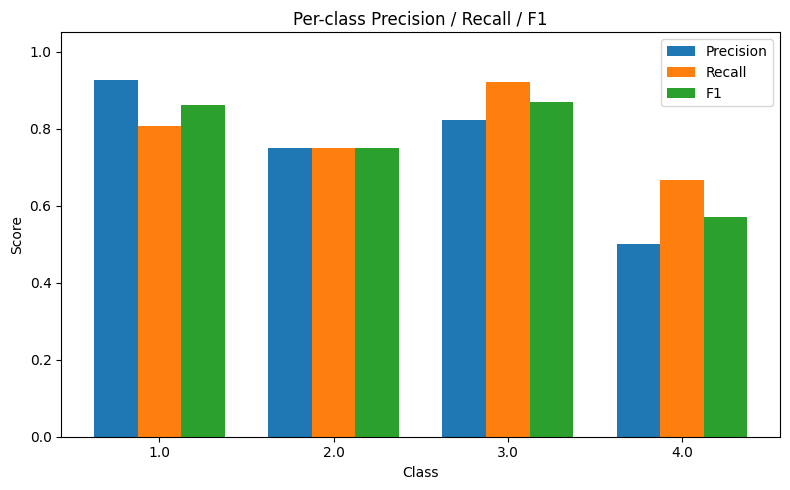

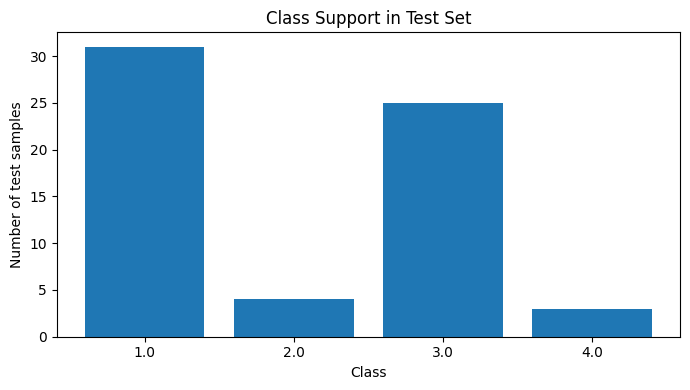

Top confusion pairs:
   true_class  pred_class  count
0         1.0         3.0      3
1         1.0         4.0      2
2         3.0         1.0      2
3         1.0         2.0      1
4         2.0         3.0      1
5         4.0         3.0      1


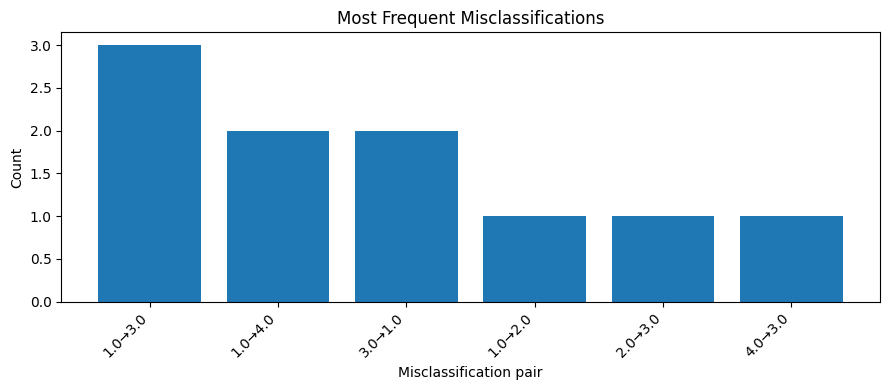

/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

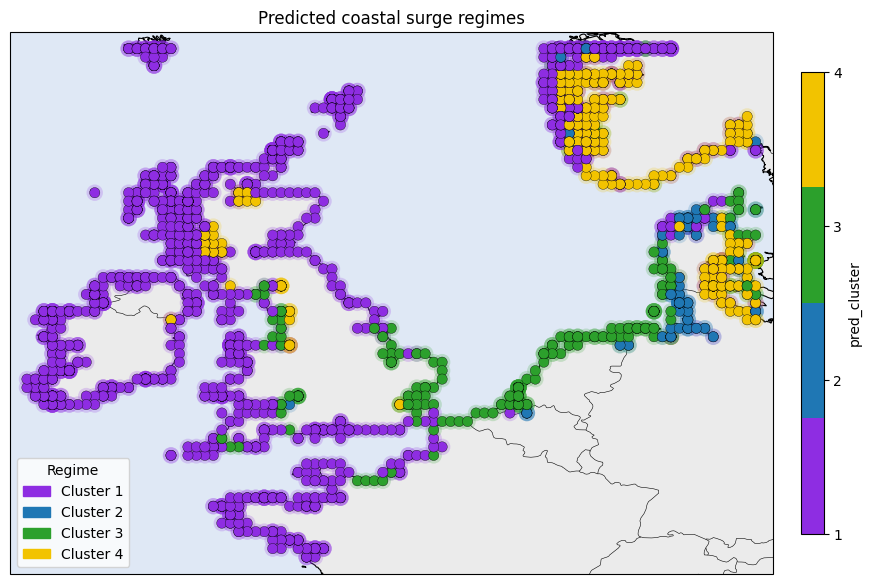

In [144]:
from sklearn.ensemble import HistGradientBoostingClassifier

pipe_hgb = Pipeline([
    ("preprocess", preprocessor),
    ("smote", SMOTE(random_state=0, k_neighbors=1)),
    ("hgb", HistGradientBoostingClassifier(random_state=0)),
])

param_dist_hgb = {
    "smote__k_neighbors": [1, 2],
    "hgb__learning_rate": [0.01, 0.03, 0.05, 0.1],
    "hgb__max_depth": [None, 5, 10, 20],
    "hgb__max_leaf_nodes": [15, 31, 63],
    "hgb__min_samples_leaf": [10, 20, 30],
    "hgb__l2_regularization": [0.0, 0.01, 0.1, 1.0],
}

search_hgb = RandomizedSearchCV(
    estimator=pipe_hgb,
    param_distributions=param_dist_hgb,
    n_iter=25,
    scoring="precision_weighted",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=0,
    refit=True,
    error_score="raise",
)

search_hgb.fit(X_train, y_train)

print("=== HistGradientBoosting ===")
print(search_hgb.best_params_)
print(search_hgb.best_score_)

best_model_hgb = search_hgb.best_estimator_
pred_hgb = best_model_hgb.predict(X_test)


results = evaluate_model_and_map(
    model = best_model_hgb ,
    X_test=X_test,
    y_test=y_test,
    X_coastline=X_coastline,
    stats_df_test=stats_df_test,
    X_train_reference=X
)

In [145]:
from sklearn.inspection import permutation_importance
from sklearn.ensemble import HistGradientBoostingClassifier

# Calculate permutation importance
result = permutation_importance(best_model_hgb, X_test, y_test, n_repeats=10, random_state=42)

# Get the importance scores
importance_scores = result.importances_mean

/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

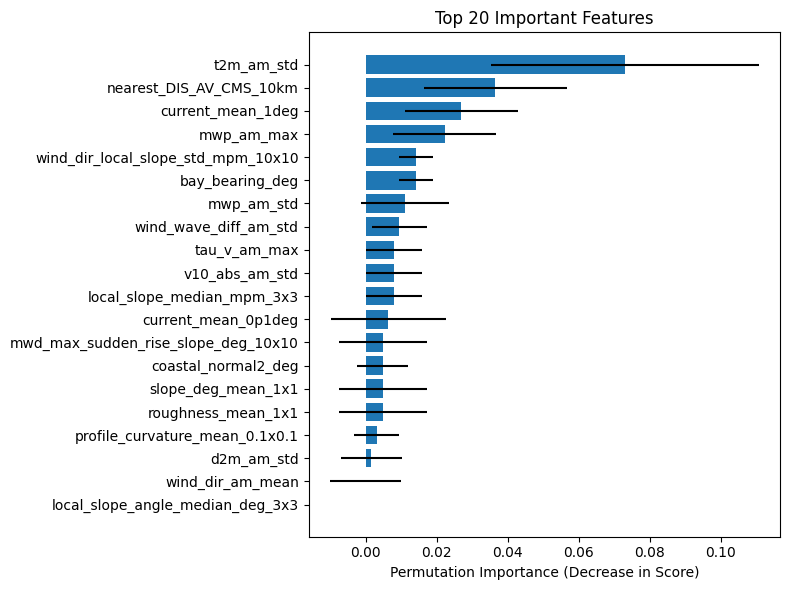

In [153]:
import numpy as np
import matplotlib.pyplot as plt

feature_names = np.array(X_test.columns)

importances_mean = result.importances_mean
importances_std = result.importances_std

# Get top 20 features (by importance, not absolute)
top_n = 20
indices = np.argsort(importances_mean)[-top_n:]

# Sort those top features for clean plotting
indices = indices[np.argsort(importances_mean[indices])]

plt.figure(figsize=(8, 6))
plt.barh(range(top_n), importances_mean[indices],
         xerr=importances_std[indices])
plt.yticks(range(top_n), feature_names[indices])
plt.xlabel("Permutation Importance (Decrease in Score)")
plt.title("Top 20 Important Features")
plt.tight_layout()
plt.show()

# Importance on a per-cluster basis

In [164]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# Split pipeline
preprocessor = best_model_hgb.named_steps["preprocess"]
model = best_model_hgb.named_steps["hgb"]  # change name if needed

# Transform data
X_train_trans = preprocessor.transform(X_train)
X_test_trans = preprocessor.transform(X_test)

# Convert sparse matrices if needed
if hasattr(X_train_trans, "toarray"):
    X_train_trans = X_train_trans.toarray()
if hasattr(X_test_trans, "toarray"):
    X_test_trans = X_test_trans.toarray()

# Feature names after preprocessing
feature_names = preprocessor.get_feature_names_out()

# Background sample
rng = np.random.default_rng(42)
bg_idx = rng.choice(X_train_trans.shape[0], size=min(100, X_train_trans.shape[0]), replace=False)
X_background = X_train_trans[bg_idx]

# Explain predicted probabilities of the final classifier
explainer = shap.Explainer(model.predict_proba, X_background)
shap_values = explainer(X_test_trans, max_evals=1000)

/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

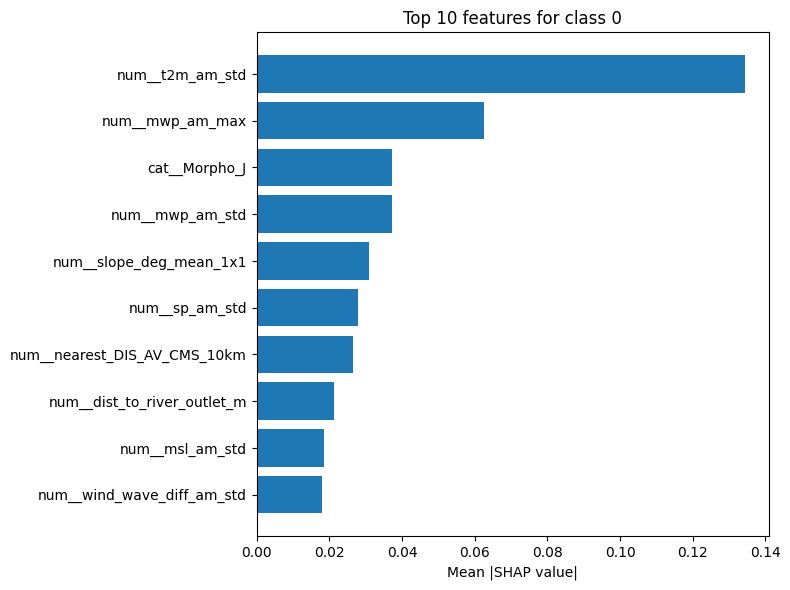

In [170]:
class_idx = 0

importance_class = np.abs(shap_values.values[:, :, class_idx]).mean(axis=0)

top_n = 10
idx = np.argsort(importance_class)[-top_n:]
idx = idx[np.argsort(importance_class[idx])]

plt.figure(figsize=(8, 6))
plt.barh(range(len(idx)), importance_class[idx])
plt.yticks(range(len(idx)), feature_names[idx])
plt.xlabel("Mean |SHAP value|")
plt.title(f"Top {top_n} features for class {class_idx}")
plt.tight_layout()
plt.show()

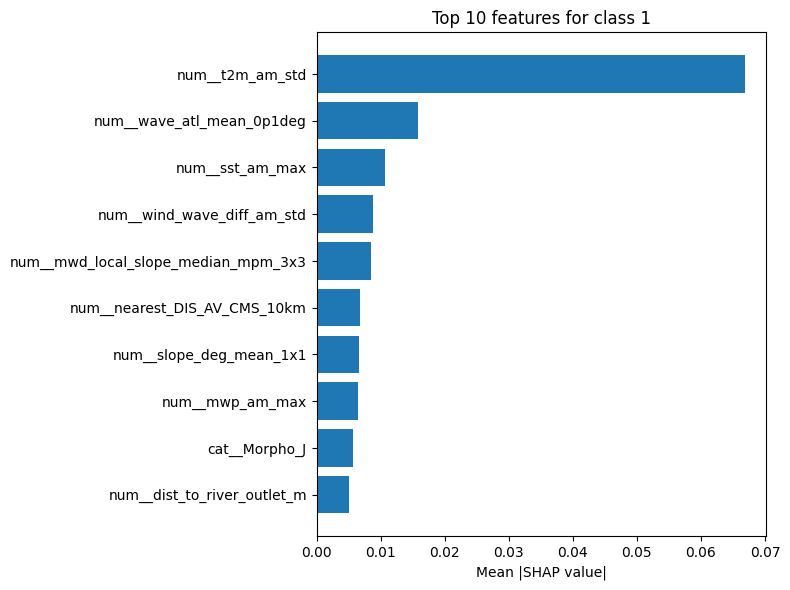

In [171]:
class_idx = 1

importance_class = np.abs(shap_values.values[:, :, class_idx]).mean(axis=0)

top_n = 10
idx = np.argsort(importance_class)[-top_n:]
idx = idx[np.argsort(importance_class[idx])]

plt.figure(figsize=(8, 6))
plt.barh(range(len(idx)), importance_class[idx])
plt.yticks(range(len(idx)), feature_names[idx])
plt.xlabel("Mean |SHAP value|")
plt.title(f"Top {top_n} features for class {class_idx}")
plt.tight_layout()
plt.show()

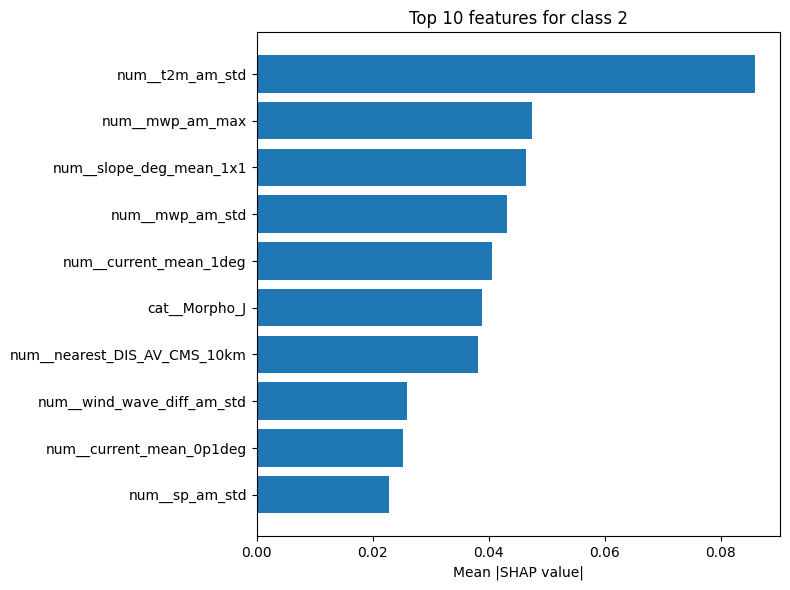

In [172]:
class_idx = 2

importance_class = np.abs(shap_values.values[:, :, class_idx]).mean(axis=0)

top_n = 10
idx = np.argsort(importance_class)[-top_n:]
idx = idx[np.argsort(importance_class[idx])]

plt.figure(figsize=(8, 6))
plt.barh(range(len(idx)), importance_class[idx])
plt.yticks(range(len(idx)), feature_names[idx])
plt.xlabel("Mean |SHAP value|")
plt.title(f"Top {top_n} features for class {class_idx}")
plt.tight_layout()
plt.show()

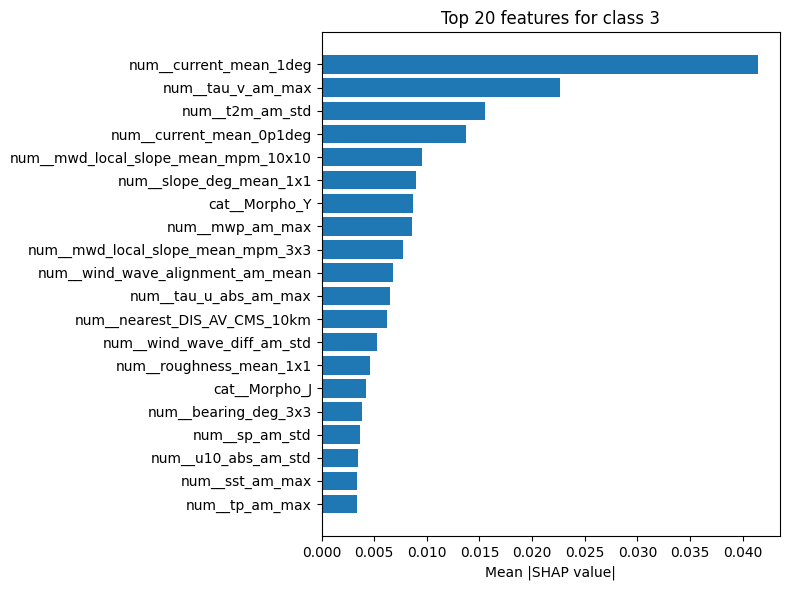

In [168]:
class_idx = 3

importance_class = np.abs(shap_values.values[:, :, class_idx]).mean(axis=0)

top_n = 20
idx = np.argsort(importance_class)[-top_n:]
idx = idx[np.argsort(importance_class[idx])]

plt.figure(figsize=(8, 6))
plt.barh(range(len(idx)), importance_class[idx])
plt.yticks(range(len(idx)), feature_names[idx])
plt.xlabel("Mean |SHAP value|")
plt.title(f"Top {top_n} features for class {class_idx}")
plt.tight_layout()
plt.show()

# No t2M

In [185]:
stats_df_test = stats_df_test.drop(columns="t2m_am_max")

In [192]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV

# Drop consistently
for df in [X, X_train, X_test, X_coastline, stats_df_test]:
    if "t2m_am_max" in df.columns:
        df.drop(columns="t2m_am_max", inplace=True)

pipe_hgb = Pipeline([
    ("preprocess", preprocessor),
    ("smote", SMOTE(random_state=0, k_neighbors=1)),
    ("hgb", HistGradientBoostingClassifier(random_state=0)),
])

param_dist_hgb = {
    "smote__k_neighbors": [1, 2],
    "hgb__learning_rate": [0.01, 0.03, 0.05, 0.1],
    "hgb__max_depth": [None, 5, 10, 20],
    "hgb__max_leaf_nodes": [15, 31, 63],
    "hgb__min_samples_leaf": [10, 20, 30],
    "hgb__l2_regularization": [0.0, 0.01, 0.1, 1.0],
}

search_hgb = RandomizedSearchCV(
    estimator=pipe_hgb,
    param_distributions=param_dist_hgb,
    n_iter=25,
    scoring="precision_weighted",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=0,
    refit=True,
    error_score="raise",
)

search_hgb.fit(X_train, y_train)

best_model_hgb = search_hgb.best_estimator_
pred_hgb = best_model_hgb.predict(X_test)

results = evaluate_model_and_map(
    model=best_model_hgb,
    X_test=X_test,
    y_test=y_test,
    X_coastline=X_coastline,
    stats_df_test=stats_df_test,
    X_train_reference=X_train
)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


ValueError: A given column is not a column of the dataframe

# RANDOMOVERSAMPLER

Fitting 3 folds for each of 30 candidates, totalling 90 fits


/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

=== RandomOverSampler + RF ===
{'rf__n_estimators': 800, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 30, 'rf__class_weight': 'balanced_subsample'}
0.838310610415841
Test accuracy: 0.8413
              precision    recall  f1-score   support

         1.0       0.93      0.81      0.86        31
         2.0       1.00      1.00      1.00         4
         3.0       0.79      0.88      0.83        25
         4.0       0.50      0.67      0.57         3

    accuracy                           0.84        63
   macro avg       0.80      0.84      0.82        63
weighted avg       0.85      0.84      0.84        63



/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

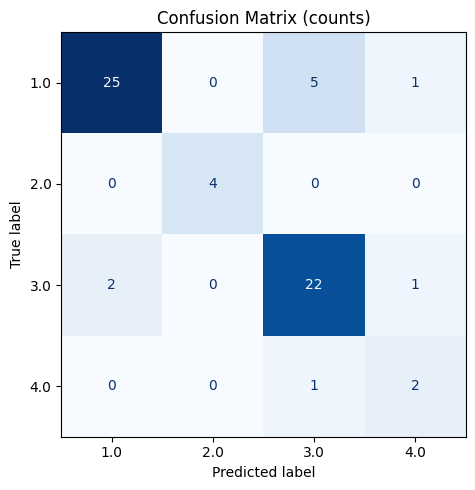

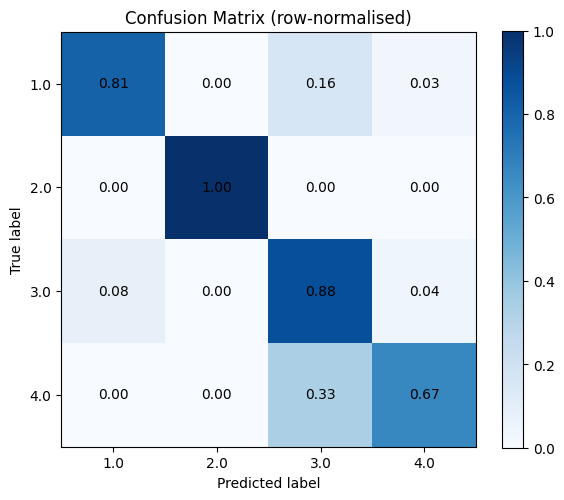

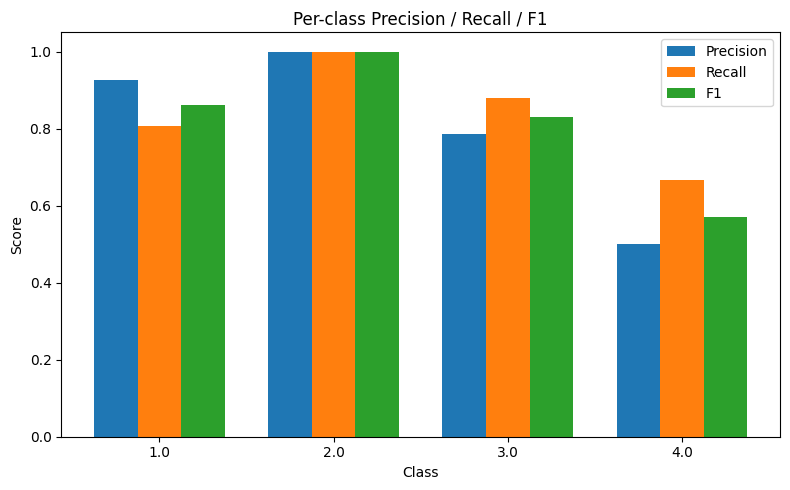

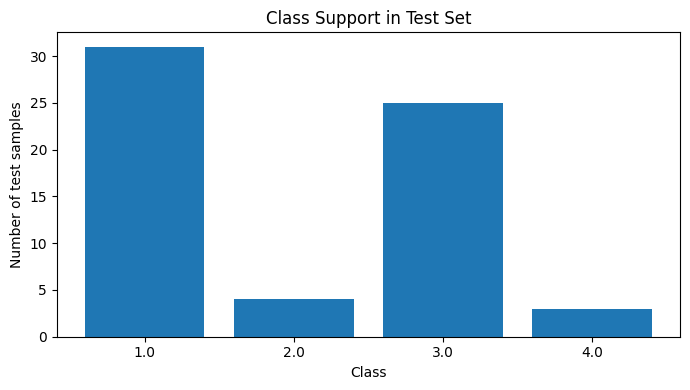

Top confusion pairs:
   true_class  pred_class  count
0         1.0         3.0      5
1         3.0         1.0      2
2         1.0         4.0      1
3         3.0         4.0      1
4         4.0         3.0      1


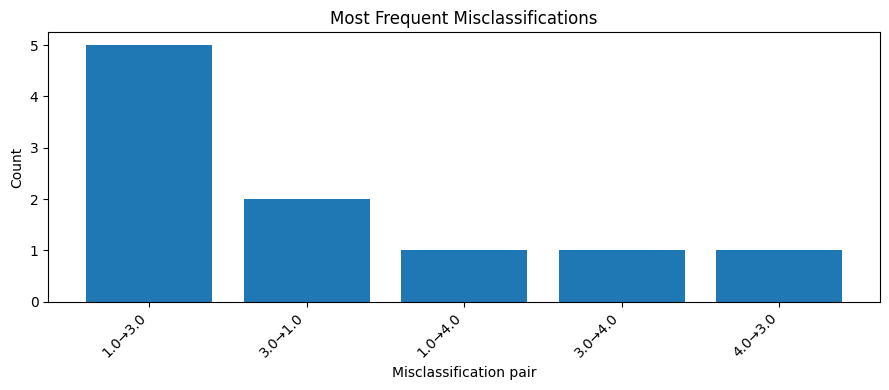

/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/impute/_base.py:598: UserWarning: Skipping features without any observed values: ['wind_dir_bearing_deg_0.25x0.25' 'wind_dir_depth_change_m_0.25x0.25'
 'wind_dir_slope_mpm_0.25x0.25' 'wind_dir_slope_deg_0.25x0.25'
 'wind_dir_local_slope_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_median_mpm_0.25x0.25'
 'wind_dir_local_slope_std_mpm_0.25x0.25'
 'wind_dir_local_slope_min_mpm_0.25x0.25'
 'wind_dir_local_slope_max_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_mean_mpm_0.25x0.25'
 'wind_dir_local_slope_abs_max_mpm_0.25x0.25'
 'wind_dir_local_slope_angle_mean_deg_0.25x0.25'
 'wind_dir_local_slope_angle_median_deg_0.25x0.25'
 'wind_dir_local_slope_angle_std_deg_0.25x0.25'
 'wind_dir_local_slope_angle_max_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_0.25x0.25'
 'wind_dir_max_sudden_drop_slope_deg_abs_0.25x0.25'
 'wind_dir_max_sudden_rise_slope_deg_0.25x0.25'
 'mwd_bearing_deg_0.25x0.25' 'mwd_depth_change_m_0.25x0.25'

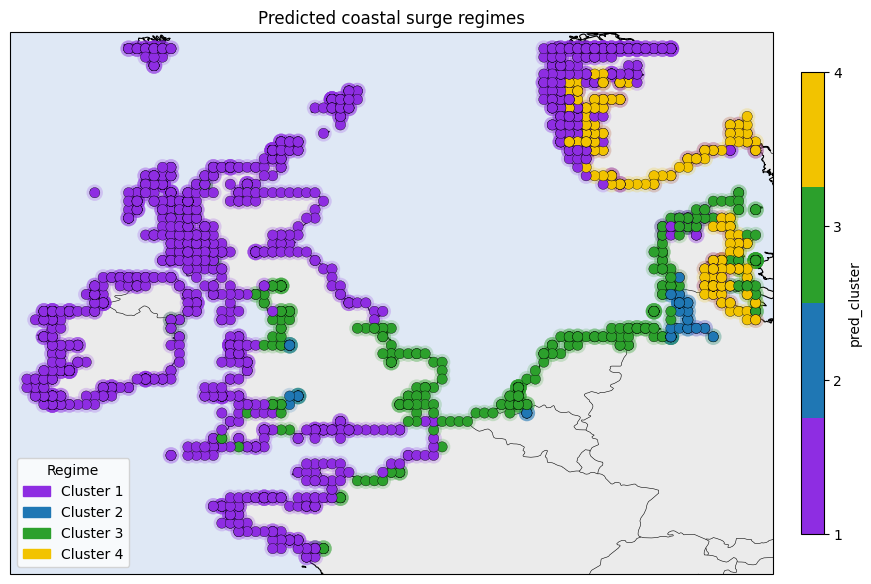

In [142]:
from imblearn.over_sampling import RandomOverSampler

pipe_ros_rf = Pipeline([
    ("preprocess", preprocessor),
    ("ros", RandomOverSampler(random_state=0)),
    ("rf", RandomForestClassifier(random_state=0, n_jobs=-1)),
])

param_dist_ros_rf = {
    "rf__n_estimators": [300, 500, 800, 1200],
    "rf__max_depth": [None, 10, 20, 30],
    "rf__min_samples_split": [2, 5, 10],
    "rf__min_samples_leaf": [1, 2, 4],
    "rf__max_features": ["sqrt", "log2", 0.5],
    "rf__class_weight": [None, "balanced", "balanced_subsample"],
}

search_ros_rf = RandomizedSearchCV(
    estimator=pipe_ros_rf,
    param_distributions=param_dist_ros_rf,
    n_iter=30,
    scoring="precision_weighted",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=0,
    refit=True,
    error_score="raise",
)

search_ros_rf.fit(X_train, y_train)

print("=== RandomOverSampler + RF ===")
print(search_ros_rf.best_params_)
print(search_ros_rf.best_score_)

best_model_ros_rf = search_ros_rf.best_estimator_
pred_ros_rf = best_model_ros_rf.predict(X_test)

results = evaluate_model_and_map(
    model=best_model_ros_rf,
    X_test=X_test,
    y_test=y_test,
    X_coastline=X_coastline,
    stats_df_test=stats_df_test,
    X_train_reference=X
)

# Apply

In [79]:
from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, support = precision_recall_fscore_support(y_test, pred)

for i, cls in enumerate(np.unique(y_test)):
    print(f"Class {cls}: Precision={precision[i]:.3f}, Recall={recall[i]:.3f}, F1={f1[i]:.3f}, Support={support[i]}")

Class 1.0: Precision=0.926, Recall=0.806, F1=0.862, Support=31
Class 2.0: Precision=1.000, Recall=1.000, F1=1.000, Support=4
Class 3.0: Precision=0.821, Recall=0.920, F1=0.868, Support=25
Class 4.0: Precision=0.500, Recall=0.667, F1=0.571, Support=3


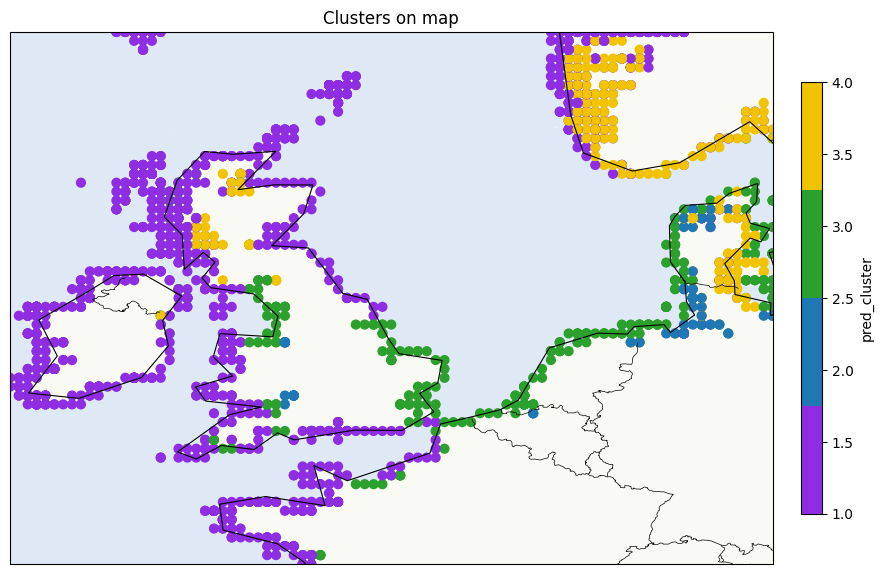

In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors

X_coastline_scaled= scaler.transform(X_coastline)
#pred_coastline = rf.predict(X_coastline_scaled)
pred_coastline = rf.predict(X_coastline_scaled)
# Attach predictions to the same rows used for prediction
stats_df_test_pred = stats_df_test.copy()
stats_df_test_pred["pred_cluster"] = pred_coastline

# Merge back into stats_df
# Option 1: by index (best if stats_df_test came directly from stats_df and index was preserved)
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
# Attach predictions to the same rows used for prediction
stats_df_test_pred = stats_df_test.copy()
stats_df_test_pred["pred_cluster"] = pred_coastline

# Pick cluster column to color by
cluster_col = "pred_cluster"   # or use an existing cluster column like "cluster_id"

# Keep only rows that have coordinates and cluster values
plot_df = stats_df_test_pred.dropna(subset=["lat", "lon", cluster_col]).copy()

# Plot
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Ensure clusters are integers and sorted
clusters = np.sort(plot_df[cluster_col].unique())
n_clusters = len(clusters)
base_colors = [
    "#8E2DE2",  # purple
    "#1F77B4",  # blue
    "#2CA02C",  # green
    "#F2C300",  # yellow
    "#E64B35",  # orange-red (NEW)
]
colors = base_colors[:n_clusters]

cmap = mcolors.ListedColormap(colors)

ax.set_global()  # or set_extent([...]) for a regional map
ax.coastlines(resolution="110m", linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, alpha=0.3)
ax.add_feature(cfeature.OCEAN, alpha=0.3)

ax.set_extent([stats_df_test_pred.lon.min(),stats_df_test_pred.lon.max(),stats_df_test_pred.lat.min(), stats_df_test_pred.lat.max()] )

sc = ax.scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df[cluster_col],
    s=40,
    cmap=cmap,
    transform=ccrs.PlateCarree()
)

plt.colorbar(sc, ax=ax, shrink=0.7, pad=0.03, label=cluster_col)
plt.title("Clusters on map")
plt.show()

# Try improve

In [204]:
from imblearn.over_sampling import SMOTE
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=0, stratify=y
)
X_train, y_train = SMOTE().fit_resample(X_train, y_train)

# Scale using TRAIN only
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# PCA using TRAIN only
pca = PCA(n_components=20, random_state=0)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

rf2 = RandomForestClassifier(
    n_estimators=1000,
    random_state=0,
    n_jobs=-1,
    class_weight="balanced",
)
rf2.fit(X_train_scaled, y_train)
pred = rf2.predict(X_test_scaled)
print("Accuracy:", accuracy_score(y_test, pred))
print(classification_report(y_test, pred))

from sklearn.model_selection import cross_val_score
scores = cross_val_score(rf2, X, y, cv=5, scoring='balanced_accuracy')
print(scores, scores.mean())

ValueError: could not convert string to float: '0.1x0.1'

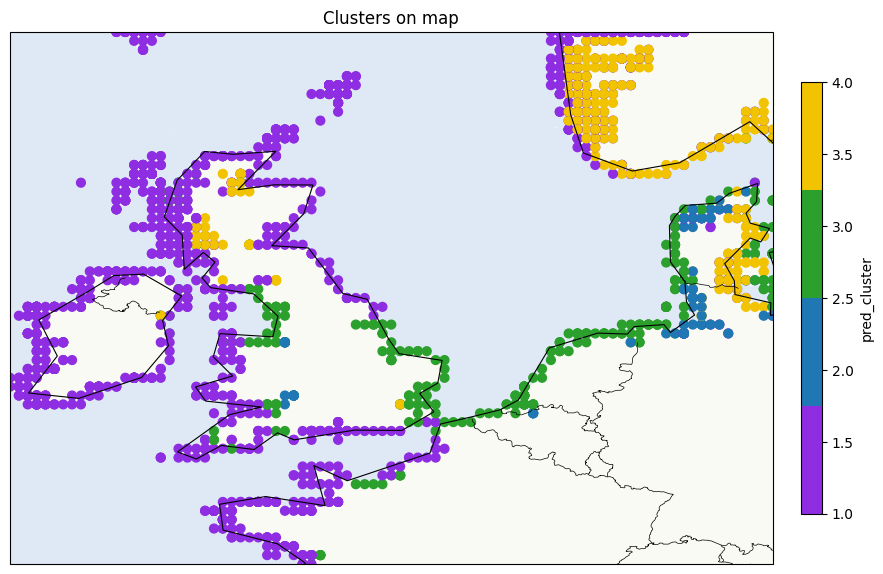

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors

X_coastline_scaled= scaler.transform(X_coastline)
#pred_coastline = rf.predict(X_coastline_scaled)
pred_coastline = rf2.predict(X_coastline_scaled)
# Attach predictions to the same rows used for prediction
stats_df_test_pred = stats_df_test.copy()
stats_df_test_pred["pred_cluster"] = pred_coastline

# Merge back into stats_df
# Option 1: by index (best if stats_df_test came directly from stats_df and index was preserved)
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
# Attach predictions to the same rows used for prediction
stats_df_test_pred = stats_df_test.copy()
stats_df_test_pred["pred_cluster"] = pred_coastline

# Pick cluster column to color by
cluster_col = "pred_cluster"   # or use an existing cluster column like "cluster_id"

# Keep only rows that have coordinates and cluster values
plot_df = stats_df_test_pred.dropna(subset=["lat", "lon", cluster_col]).copy()

# Plot
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Ensure clusters are integers and sorted
clusters = np.sort(plot_df[cluster_col].unique())
n_clusters = len(clusters)
base_colors = [
    "#8E2DE2",  # purple
    "#1F77B4",  # blue
    "#2CA02C",  # green
    "#F2C300",  # yellow
    "#E64B35",  # orange-red (NEW)
]
colors = base_colors[:n_clusters]

cmap = mcolors.ListedColormap(colors)

ax.set_global()  # or set_extent([...]) for a regional map
ax.coastlines(resolution="110m", linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, alpha=0.3)
ax.add_feature(cfeature.OCEAN, alpha=0.3)

ax.set_extent([stats_df_test_pred.lon.min(),stats_df_test_pred.lon.max(),stats_df_test_pred.lat.min(), stats_df_test_pred.lat.max()] )

sc = ax.scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df[cluster_col],
    s=40,
    cmap=cmap,
    transform=ccrs.PlateCarree()
)

plt.colorbar(sc, ax=ax, shrink=0.7, pad=0.03, label=cluster_col)
plt.title("Clusters on map")
plt.show()

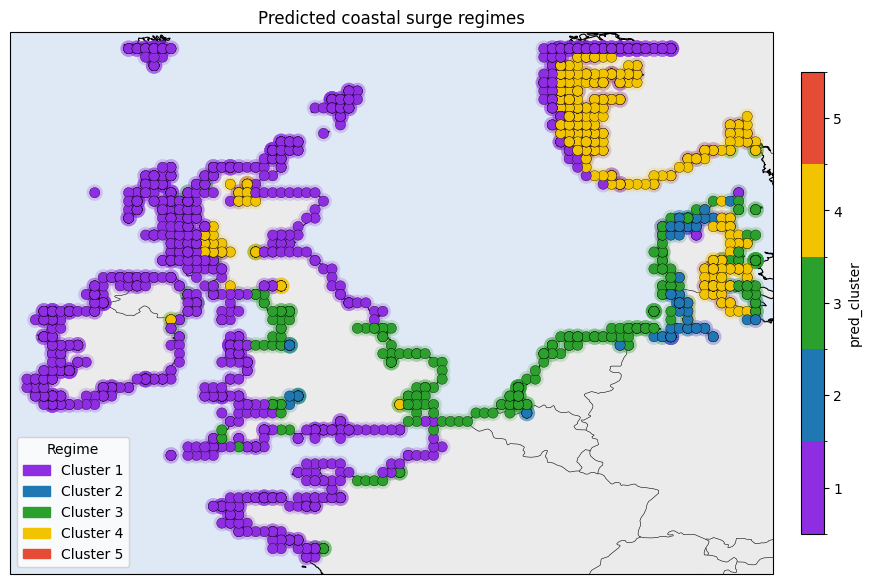

In [83]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import cartopy.crs as ccrs
import cartopy.feature as cfeature

cluster_col = "pred_cluster"
plot_df = stats_df_test_pred.dropna(subset=["lat", "lon", cluster_col]).copy()
plot_df[cluster_col] = plot_df[cluster_col].astype(int).replace({6: 5})

clusters = np.array([1, 2, 3, 4, 5])
n_clusters = len(clusters)

base_colors = [
    "#8E2DE2",  # 1 purple
    "#1F77B4",  # 2 blue
    "#2CA02C",  # 3 green
    "#F2C300",  # 4 yellow
    "#E64B35",  # 5 orange-red
]
colors = base_colors[:n_clusters]
cmap = mcolors.ListedColormap(colors)

# discrete bins centered on 1,2,3,4,5
bounds = np.arange(0.5, 5.6, 1)
norm = mcolors.BoundaryNorm(bounds, cmap.N)

fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, facecolor="0.92")
ax.add_feature(cfeature.OCEAN, facecolor="#dfe8f5")
ax.coastlines(resolution="10m", linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linewidth=0.4)

ax.set_extent([
    plot_df["lon"].min() - 0.5,
    plot_df["lon"].max() + 0.5,
    plot_df["lat"].min() - 0.5,
    plot_df["lat"].max() + 0.5
], crs=ccrs.PlateCarree())

# soft halo
ax.scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df[cluster_col],
    s=140,
    alpha=0.20,
    cmap=cmap,
    norm=norm,
    linewidth=0,
    transform=ccrs.PlateCarree(),
    zorder=2
)

# main points
sc = ax.scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df[cluster_col],
    s=55,
    cmap=cmap,
    norm=norm,
    edgecolor="k",
    linewidth=0.25,
    transform=ccrs.PlateCarree(),
    zorder=3
)

# short local segments
for cluster in clusters:
    subset = plot_df.loc[plot_df[cluster_col] == cluster, ["lon", "lat"]].copy()
    if len(subset) < 2:
        continue

    subset = subset.sort_values(["lat", "lon"]).reset_index(drop=True)

    max_dist = 0.4
    for i in range(len(subset) - 1):
        x1, y1 = subset.loc[i, ["lon", "lat"]]
        x2, y2 = subset.loc[i + 1, ["lon", "lat"]]
        dist = np.hypot(x2 - x1, y2 - y1)

        if dist <= max_dist:
            ax.plot(
                [x1, x2], [y1, y2],
                color=colors[cluster - 1],   # <- fixed
                linewidth=2.0,
                alpha=0.8,
                transform=ccrs.PlateCarree(),
                zorder=2.5
            )

handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {i+1}")
    for i in range(n_clusters)
]
ax.legend(handles=handles, loc="lower left", title="Regime", frameon=True)

cbar = plt.colorbar(sc, ax=ax, shrink=0.75, pad=0.03)
cbar.set_label(cluster_col)
cbar.set_ticks(clusters)
cbar.set_ticklabels(clusters)

plt.title("Predicted coastal surge regimes")
plt.show()

# Model A: no SMOTE

In [84]:
from imblearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

pipe = Pipeline([
    ("rf", RandomForestClassifier(random_state=0, n_jobs=-1))
])

param_dist = {
    "rf__n_estimators": [300, 500, 800, 1200],
    "rf__max_depth": [None, 10, 20, 30],
    "rf__min_samples_split": [2, 5, 10],
    "rf__min_samples_leaf": [1, 2, 4],
    "rf__max_features": ["sqrt", "log2", 0.5],
    "rf__class_weight": [None, "balanced", "balanced_subsample"]
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_dist,
    n_iter=40,
    scoring="f1_weighted",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=0,
    refit=True
)

search.fit(X_train, y_train)
print(search.best_params_)
print(search.best_score_)

pred = search.best_estimator_.predict(X_test)
print("Test accuracy:", accuracy_score(y_test, pred))
print(classification_report(y_test, pred))

Fitting 5 folds for each of 40 candidates, totalling 200 fits
{'rf__n_estimators': 500, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10, 'rf__class_weight': 'balanced_subsample'}
0.9209701975856776
Test accuracy: 0.8571428571428571
              precision    recall  f1-score   support

         1.0       0.93      0.81      0.86        31
         2.0       1.00      1.00      1.00         4
         3.0       0.82      0.92      0.87        25
         4.0       0.50      0.67      0.57         3

    accuracy                           0.86        63
   macro avg       0.81      0.85      0.83        63
weighted avg       0.87      0.86      0.86        63



/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


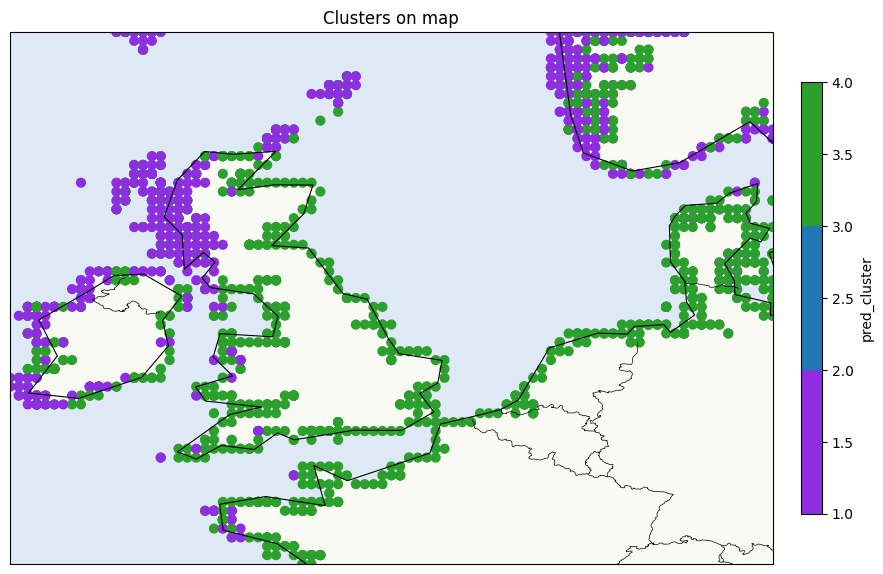

In [85]:
pred_coastline = search.best_estimator_.predict(X_coastline_scaled)

import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors
# Attach predictions to the same rows used for prediction
stats_df_test_pred = stats_df_test.copy()
stats_df_test_pred["pred_cluster"] = pred_coastline

# Merge back into stats_df
# Option 1: by index (best if stats_df_test came directly from stats_df and index was preserved)
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
# Attach predictions to the same rows used for prediction
stats_df_test_pred = stats_df_test.copy()
stats_df_test_pred["pred_cluster"] = pred_coastline

# Pick cluster column to color by
cluster_col = "pred_cluster"   # or use an existing cluster column like "cluster_id"

# Keep only rows that have coordinates and cluster values
plot_df = stats_df_test_pred.dropna(subset=["lat", "lon", cluster_col]).copy()

# Plot
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Ensure clusters are integers and sorted
clusters = np.sort(plot_df[cluster_col].unique())
n_clusters = len(clusters)
base_colors = [
    "#8E2DE2",  # purple
    "#1F77B4",  # blue
    "#2CA02C",  # green
    "#F2C300",  # yellow
    "#E64B35",  # orange-red (NEW)
]
colors = base_colors[:n_clusters]

cmap = mcolors.ListedColormap(colors)

ax.set_global()  # or set_extent([...]) for a regional map
ax.coastlines(resolution="110m", linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, alpha=0.3)
ax.add_feature(cfeature.OCEAN, alpha=0.3)

ax.set_extent([stats_df_test_pred.lon.min(),stats_df_test_pred.lon.max(),stats_df_test_pred.lat.min(), stats_df_test_pred.lat.max()] )

sc = ax.scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df[cluster_col],
    s=40,
    cmap=cmap,
    transform=ccrs.PlateCarree()
)

plt.colorbar(sc, ax=ax, shrink=0.7, pad=0.03, label=cluster_col)
plt.title("Clusters on map")
plt.show()

# Model B: SMOTE but no scaler

In [86]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

pipe = Pipeline([
    ("smote", SMOTE(random_state=1)),
    ("rf", RandomForestClassifier(random_state=0, n_jobs=-1))
])

param_dist = {
    "smote__k_neighbors": [3, 5, 7],
    "rf__n_estimators": [300, 500, 800, 1200],
    "rf__max_depth": [None, 10, 20, 30],
    "rf__min_samples_split": [2, 5, 10],
    "rf__min_samples_leaf": [1, 2, 4],
    "rf__max_features": ["sqrt", "log2", 0.5],
    "rf__class_weight": [None, "balanced", "balanced_subsample"]
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

search_smoth = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_dist,
    n_iter=40,
    scoring="balanced_accuracy",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=0,
    refit=True
)

search_smoth.fit(X_train, y_train)
print(search.best_params_)
print(search.best_score_)

pred = search_smoth.best_estimator_.predict(X_test)
print("Test accuracy:", accuracy_score(y_test, pred))
print(classification_report(y_test, pred))

Fitting 5 folds for each of 40 candidates, totalling 200 fits
{'rf__n_estimators': 500, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10, 'rf__class_weight': 'balanced_subsample'}
0.9209701975856776
Test accuracy: 0.8253968253968254
              precision    recall  f1-score   support

         1.0       0.93      0.81      0.86        31
         2.0       1.00      0.75      0.86         4
         3.0       0.79      0.88      0.83        25
         4.0       0.40      0.67      0.50         3

    accuracy                           0.83        63
   macro avg       0.78      0.78      0.76        63
weighted avg       0.85      0.83      0.83        63



/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


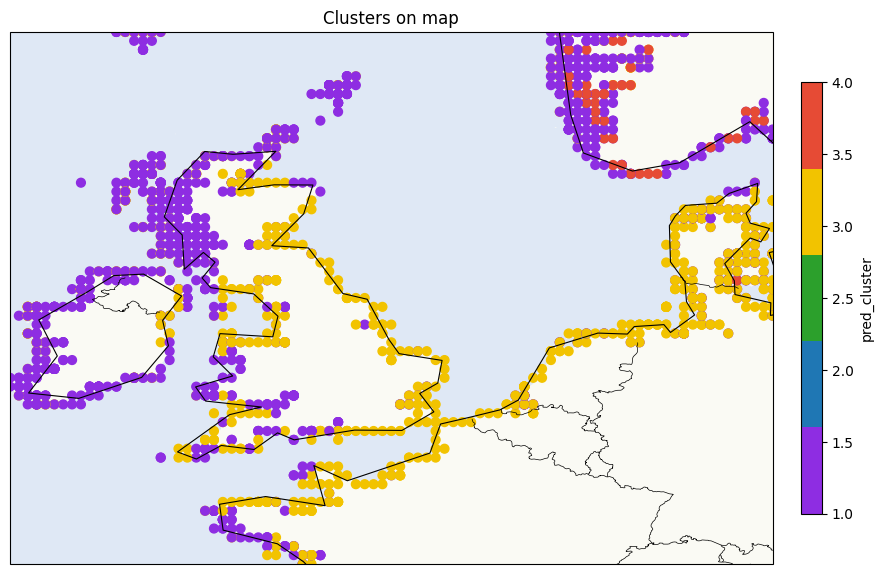

In [87]:
pred_coastline = search_smoth.best_estimator_.predict(X_coastline_scaled)

import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors
# Attach predictions to the same rows used for prediction
stats_df_test_pred = stats_df_test.copy()
stats_df_test_pred["pred_cluster"] = pred_coastline

# Merge back into stats_df
# Option 1: by index (best if stats_df_test came directly from stats_df and index was preserved)
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
# Attach predictions to the same rows used for prediction
stats_df_test_pred = stats_df_test.copy()
stats_df_test_pred["pred_cluster"] = pred_coastline

# Pick cluster column to color by
cluster_col = "pred_cluster"   # or use an existing cluster column like "cluster_id"

# Keep only rows that have coordinates and cluster values
plot_df = stats_df_test_pred.dropna(subset=["lat", "lon", cluster_col]).copy()

# Plot
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Ensure clusters are integers and sorted
clusters = np.sort(plot_df[cluster_col].unique())
n_clusters = 5
base_colors = [
    "#8E2DE2",  # purple
    "#1F77B4",  # blue
    "#2CA02C",  # green
    "#F2C300",  # yellow
    "#E64B35",  # orange-red (NEW)
]
colors = base_colors[:n_clusters]

cmap = mcolors.ListedColormap(colors)

ax.set_global()  # or set_extent([...]) for a regional map
ax.coastlines(resolution="110m", linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, alpha=0.3)
ax.add_feature(cfeature.OCEAN, alpha=0.3)

ax.set_extent([stats_df_test_pred.lon.min(),stats_df_test_pred.lon.max(),stats_df_test_pred.lat.min(), stats_df_test_pred.lat.max()] )

sc = ax.scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df[cluster_col],
    s=40,
    cmap=cmap,
    transform=ccrs.PlateCarree()
)

plt.colorbar(sc, ax=ax, shrink=0.7, pad=0.03, label=cluster_col)
plt.title("Clusters on map")
plt.show()

IndexError: list index out of range

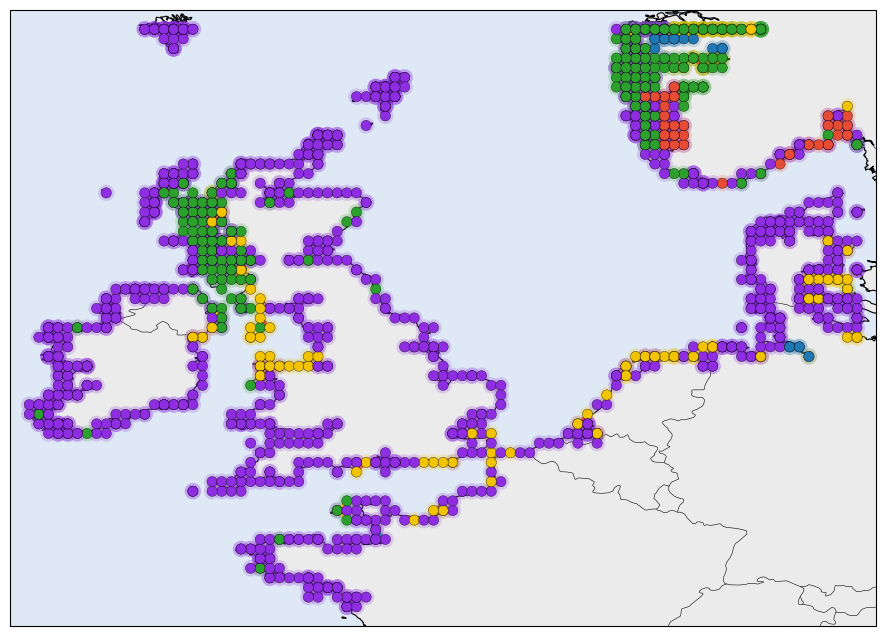

In [174]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# --- setup ---
cluster_col = "pred_cluster"
plot_df = stats_df_test_pred.dropna(subset=["lat", "lon", cluster_col]).copy()
plot_df[cluster_col] = plot_df[cluster_col].astype(int)

clusters = np.sort(plot_df[cluster_col].unique())
n_clusters = len(clusters)

base_colors = [
    "#8E2DE2",  # purple
    "#1F77B4",  # blue
    "#2CA02C",  # green
    "#F2C300",  # yellow
    "#E64B35",  # orange-red
]
colors = base_colors[:n_clusters]
cmap = mcolors.ListedColormap(colors)

fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, facecolor="0.92")
ax.add_feature(cfeature.OCEAN, facecolor="#dfe8f5")
ax.coastlines(resolution="10m", linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linewidth=0.4)

ax.set_extent([
    plot_df["lon"].min() - 0.5,
    plot_df["lon"].max() + 0.5,
    plot_df["lat"].min() - 0.5,
    plot_df["lat"].max() + 0.5
], crs=ccrs.PlateCarree())

# --- soft halo underneath ---
ax.scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df[cluster_col],
    s=140,
    alpha=0.20,
    cmap=cmap,
    linewidth=0,
    transform=ccrs.PlateCarree(),
    zorder=2
)

# --- main points ---
sc = ax.scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df[cluster_col],
    s=55,
    cmap=cmap,
    edgecolor="k",
    linewidth=0.25,
    transform=ccrs.PlateCarree(),
    zorder=3
)

# --- optional: connect only short local segments within each cluster ---
# This avoids long bogus coast-crossing lines.
for cluster in clusters:
    subset = plot_df.loc[plot_df[cluster_col] == cluster, ["lon", "lat"]].copy()

    coords = subset[["lon", "lat"]].to_numpy()
    if len(coords) < 2:
        continue

    # naive local linking: sort by latitude then longitude as a rough path
    subset = subset.sort_values(["lat", "lon"]).reset_index(drop=True)

    # only draw segment if adjacent points are close enough
    max_dist = 0.4  # tune to your station spacing
    for i in range(len(subset) - 1):
        x1, y1 = subset.loc[i, ["lon", "lat"]]
        x2, y2 = subset.loc[i + 1, ["lon", "lat"]]
        dist = np.hypot(x2 - x1, y2 - y1)

        if dist <= max_dist:
            ax.plot(
                [x1, x2], [y1, y2],
                color=colors[int(cluster)],
                linewidth=2.0,
                alpha=0.8,
                transform=ccrs.PlateCarree(),
                zorder=2.5
            )

# --- legend instead of only colorbar ---
handles = [
    mpatches.Patch(color=colors[i], label=f"Cluster {clusters[i]}")
    for i in range(n_clusters)
]
ax.legend(handles=handles, loc="lower left", title="Regime", frameon=True)

plt.colorbar(sc, ax=ax, shrink=0.75, pad=0.03, label=cluster_col)
plt.title("Predicted coastal surge regimes")
plt.show()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# keep only numeric columns
X = X.select_dtypes(include=[np.number]).copy()

# replace inf with NaN
X = X.replace([np.inf, -np.inf], np.nan)

# drop columns that are all NaN
X = X.dropna(axis=1, how='all')

# fill remaining NaNs with column means
X = X.fillna(X.mean())
# scale
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/Users/lb962/miniconda3/envs/telec_env/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


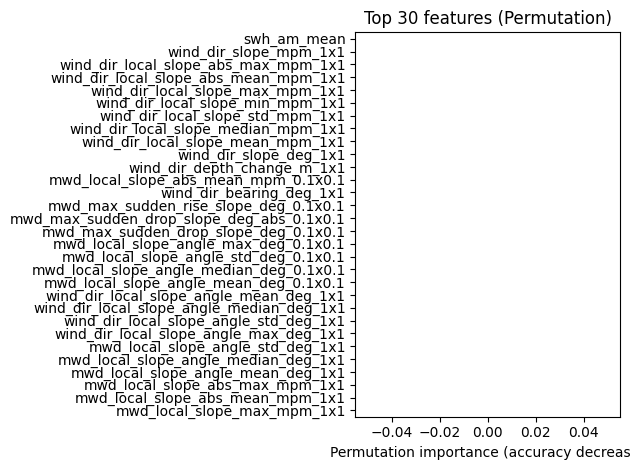

In [88]:
from sklearn.inspection import permutation_importance
# --------------------------------------------------
mdi = pd.Series(rf2.feature_importances_, index=X.columns).sort_values(ascending=False)

perm = permutation_importance(
    rf2,
    X_test,
    y_test,
    n_repeats=30,
    random_state=0,
    n_jobs=-1
)

perm_df = (
    pd.DataFrame({
        "mean": perm.importances_mean,
        "std": perm.importances_std
    }, index=X.columns)
    .sort_values("mean", ascending=False)
)

top_n = 30

plt.figure()
perm_df.head(top_n)["mean"].iloc[::-1].plot(
    kind="barh",
    xerr=perm_df.head(top_n)["std"].iloc[::-1]
)
plt.xlabel("Permutation importance (accuracy decrease)")
plt.title(f"Top {top_n} features (Permutation)")
plt.tight_layout()
plt.show()



Cluster structure is reproducible from independent features.

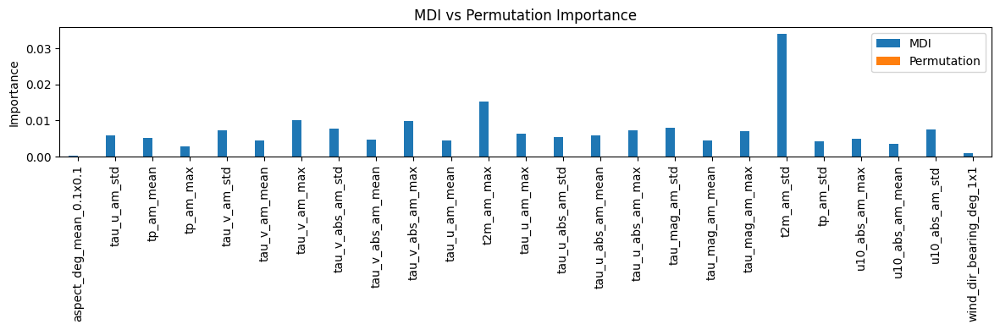

In [89]:
compare = pd.DataFrame({
    "MDI": mdi,
    "Permutation": perm_df["mean"]
}).dropna()

top = compare.sort_values("Permutation", ascending=False).head(25)

top.plot(kind="bar", figsize=(12, 4))
plt.ylabel("Importance")
plt.title("MDI vs Permutation Importance")
plt.tight_layout()
plt.show()


In [90]:
plot_df["cluster"] = plot_df["pred_cluster"]
weathercluster_df = plot_df

In [91]:
top_feat = list(top.reset_index()["index"])

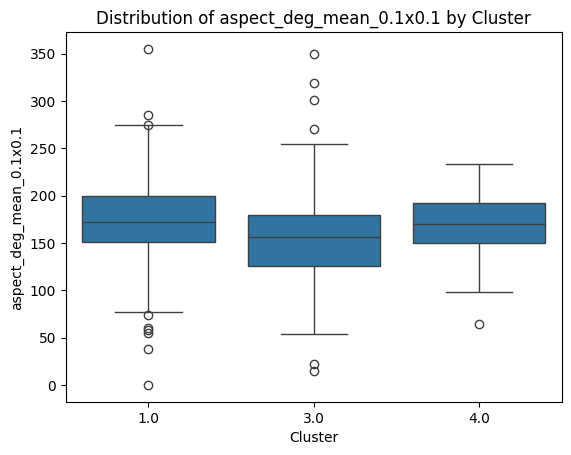

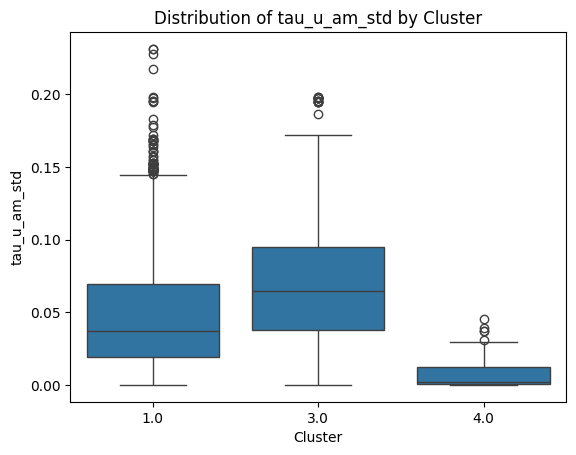

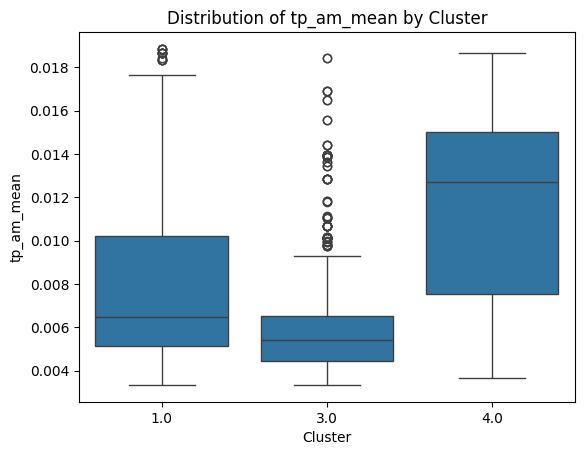

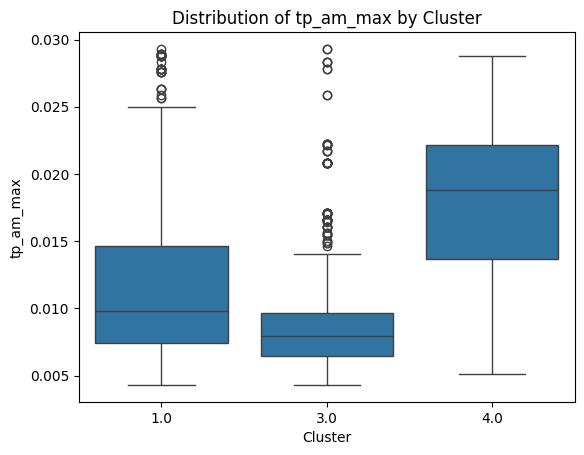

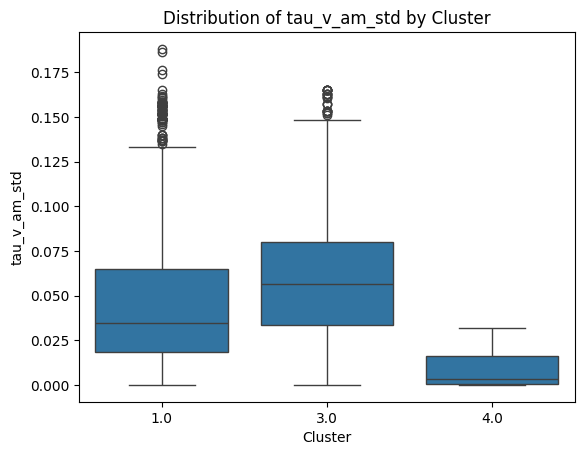

...

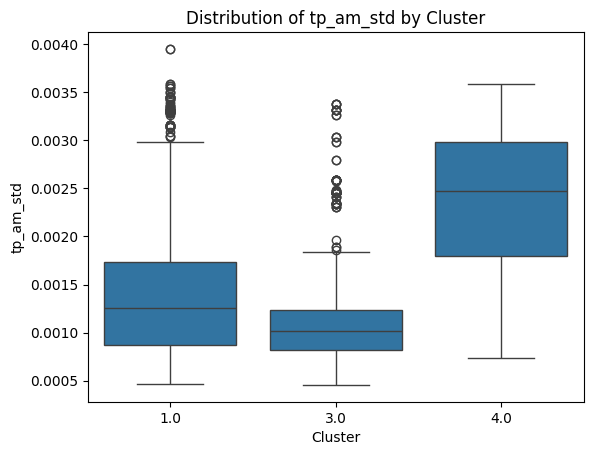

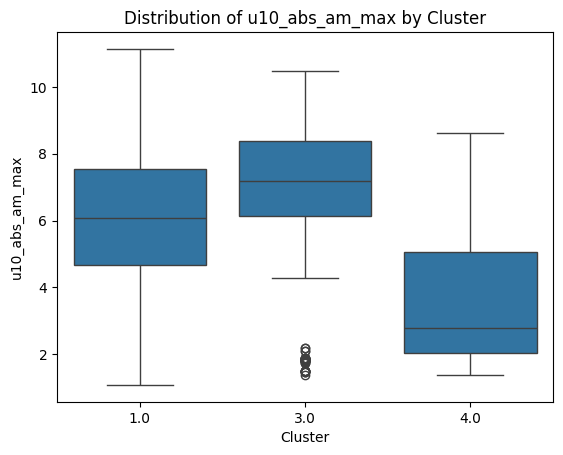

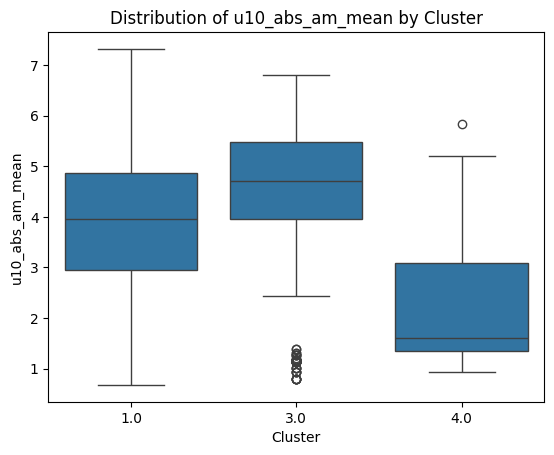

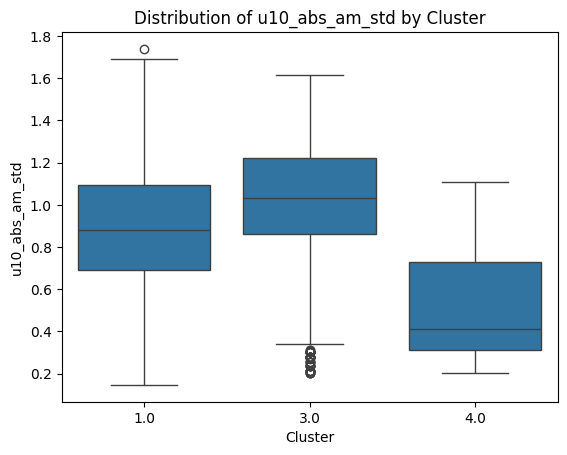

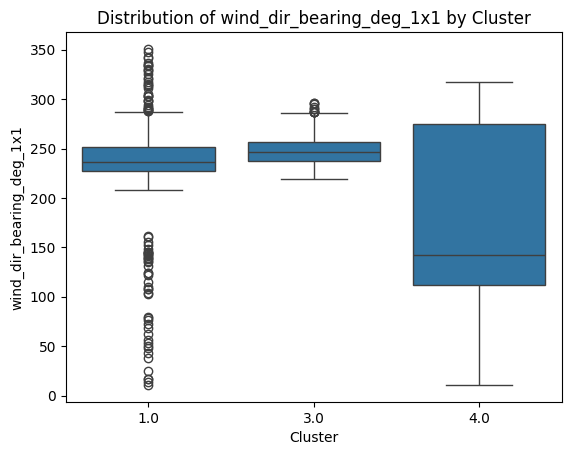

In [92]:
import seaborn as sns
import matplotlib.pyplot as plt

# Loop through each feature and plot
for col in top_feat:
    plt.figure()
    sns.boxplot(data=weathercluster_df, x='cluster', y=col)
    plt.title(f'Distribution of {col} by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(col)
    plt.show()

In [93]:
import numpy as np
import pandas as pd
from itertools import combinations

def cohens_d(a, b):
    a = np.asarray(a)
    b = np.asarray(b)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]

    na, nb = len(a), len(b)
    if na < 2 or nb < 2:
        return np.nan

    sa, sb = np.var(a, ddof=1), np.var(b, ddof=1)
    pooled =ß np.sqrt(((na - 1)*sa + (nb - 1)*sb) / (na + nb - 2))
    return (np.mean(a) - np.mean(b)) / pooled
features = ["aspect_deg_mean_0.1x0.1"]  # add more if you want
clusters = sorted(weathercluster_df["cluster"].unique())

rows = []
for feat in features:
    for c1, c2 in combinations(clusters, 2):
        a = weathercluster_df.loc[weathercluster_df.cluster == c1, feat]
        b = weathercluster_df.loc[weathercluster_df.cluster == c2, feat]
        d = cohens_d(a, b)
        rows.append({
            "feature": feat,
            "cluster_1": c1,
            "cluster_2": c2,
            "cohens_d": d,
            "abs_d": abs(d)
        })

d_all = (
    pd.DataFrame(rows)
      .sort_values(["feature", "abs_d"], ascending=[True, False])
)

d_all


SyntaxError: invalid syntax (2706653561.py, line 16)

# unequal group sizes
mean / sqrt (std1^2+std2^2)

In [94]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

df = model_df.copy()[[c for c in top if c in model_df.columns]]

# drop obvious non-predictors if desired
drop_cols = ["geometry"]
df = df.drop(columns=[c for c in drop_cols if c in df.columns])

cols = df.columns
n_cols = len(cols)

n_per_row = 3
n_rows = int(np.ceil(n_cols / n_per_row))

fig, axes = plt.subplots(n_rows, n_per_row, figsize=(12, 3*n_rows))
axes = axes.flatten()

for i, col in enumerate(cols):

    ax = axes[i]

    if pd.api.types.is_numeric_dtype(df[col]):
        ax.hist(df[col].dropna(), bins=30)
        ax.set_ylabel("count")
    else:
        df[col].value_counts().plot(kind="bar", ax=ax)
        ax.set_ylabel("count")

    ax.set_title(col, fontsize=9)
    ax.tick_params(axis="x", labelsize=7)
    ax.tick_params(axis="y", labelsize=7)

# remove unused axes
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

ValueError: Number of rows must be a positive integer, not 0

<Figure size 1200x0 with 0 Axes>

In [95]:
weathercluster_df

,station,swh_am_mean,swh_am_std,swh_am_max,mwp_am_mean,mwp_am_std,mwp_am_max,wsk_am_mean,wsk_am_std,wsk_am_max,...,dist_to_river_outlet_m,GEV_ID,HYRIV_ID,dist_to_nearest_river_m,nearest_CATCH_SKM_10km,nearest_DIS_AV_CMS_10km,river_index_10km,coastal_type,pred_cluster,cluster
0,1,1.486680,0.204406,1.997264,9.393989,0.494430,10.740682,0.096669,0.019436,0.149174,...,14467.854359,0,20456714,14467.854359,NaN,NaN,NaN,84200 Coastal waters,1.0,1.0
1,2,1.486680,0.204406,1.997264,9.393989,0.494430,10.740682,0.096669,0.019436,0.149174,...,14467.854359,1,20456714,14467.854359,NaN,NaN,NaN,84200 Coastal waters,1.0,1.0
2,3,1.460372,0.198554,1.993745,9.370844,0.484044,10.740682,0.097001,0.019185,0.149174,...,3204.836919,2,20454211,2913.575138,7.46,4.990,0.425722,84200 Coastal waters,3.0,3.0
3,4,1.486680,0.204406,1.997264,9.393989,0.494430,10.740682,0.096669,0.019436,0.149174,...,14467.854359,3,20456714,14467.854359,NaN,NaN,NaN,84200 Coastal waters,3.0,3.0
4,5,1.486680,0.204406,1.997264,9.393989,0.494430,10.740682,0.096669,0.019436,0.149174,...,6812.760646,4,20446778,3942.145769,16.60,0.276,0.031196,84200 Coastal waters,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2176,1707,0.773800,0.098822,0.994938,3.473739,0.151436,3.792792,0.022989,0.001528,0.026615,...,4314.182834,2184,20256369,3487.287323,20.06,0.224,0.038035,NaN,3.0,3.0
2177,1708,0.906093,0.118388,1.177513,3.662463,0.166779,4.034247,0.022988,0.001150,0.025608,...,10467.678513,2185,20253095,10467.678513,NaN,NaN,NaN,NaN,3.0,3.0
2178,1709,0.773800,0.098822,0.994938,3.473739,0.151436,3.792792,0.022989,0.001528,0.026615,...,7814.482640,2186,20252312,7814.482640,9.87,0.111,0.011942,NaN,3.0,3.0
2179,1710,0.807282,0.118869,1.157414,4.573733,0.302855,5.235375,0.011273,0.001923,0.015736,...,9505.015196,2187,20180898,9505.015196,1.66,0.932,0.062690,NaN,1.0,1.0


In [96]:
top

,MDI,Permutation
aspect_deg_mean_0.1x0.1,0.000369,0.0
tau_u_am_std,0.005801,0.0
tp_am_mean,0.005136,0.0
tp_am_max,0.002832,0.0
tau_v_am_std,0.007244,0.0
tau_v_am_mean,0.004530,0.0
tau_v_am_max,0.010026,0.0
tau_v_abs_am_std,0.007683,0.0
tau_v_abs_am_mean,0.004757,0.0
tau_v_abs_am_max,0.009776,0.0


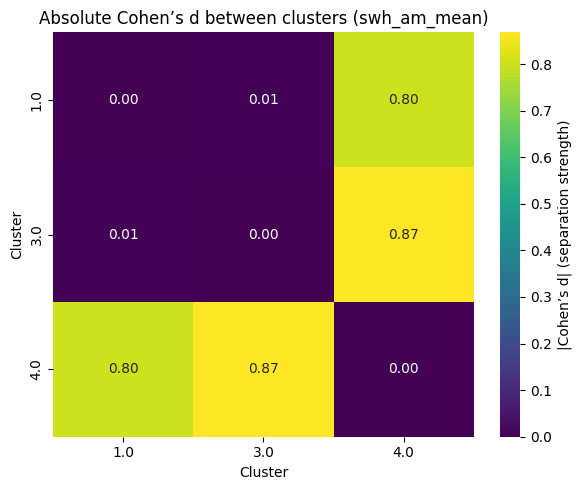

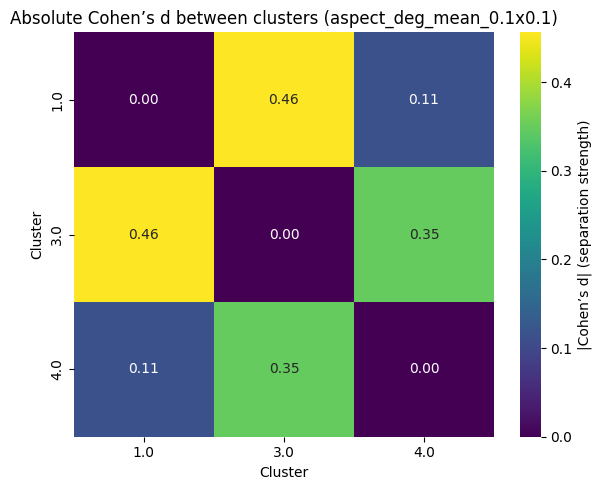

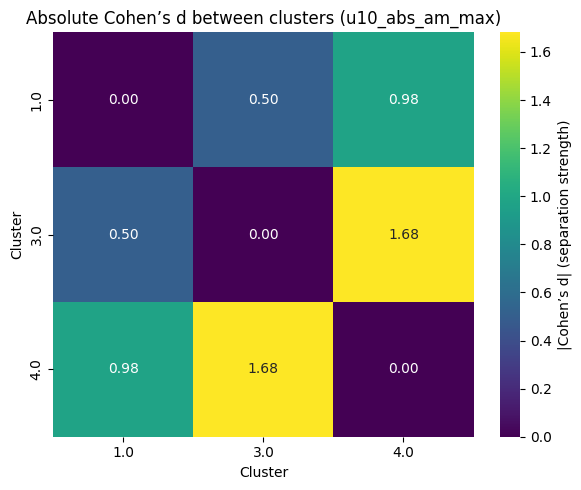

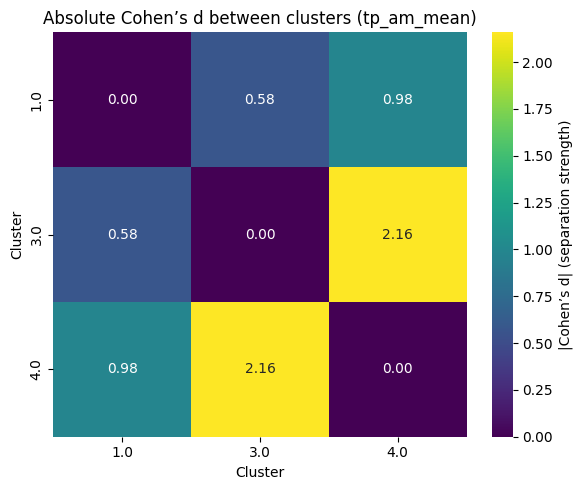

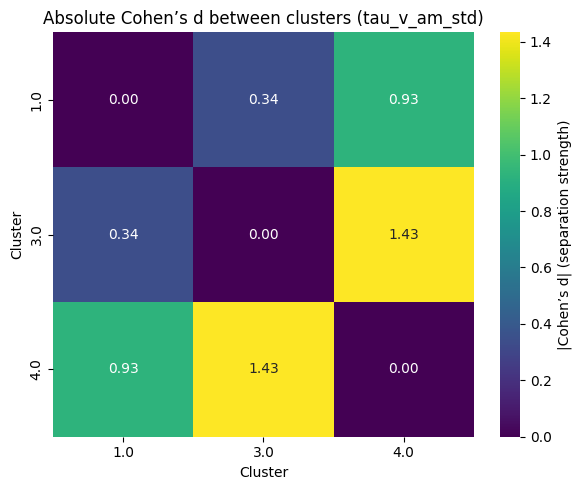

In [97]:

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def cohens_d(a, b):
    a = np.asarray(a)
    b = np.asarray(b)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]

    na, nb = len(a), len(b)
    if na < 2 or nb < 2:
        return np.nan

    sa, sb = np.var(a, ddof=1), np.var(b, ddof=1)
    pooled = np.sqrt(((na - 1)*sa + (nb - 1)*sb) / (na + nb - 2))
    return (np.mean(a) - np.mean(b)) / pooled


def cohens_d_abs_matrix(df, feature):
    clusters = sorted(df["cluster"].unique())
    mat = pd.DataFrame(index=clusters, columns=clusters, dtype=float)

    for i in clusters:
        for j in clusters:
            if i == j:
                mat.loc[i, j] = 0.0
            else:
                a = df.loc[df.cluster == i, feature]
                b = df.loc[df.cluster == j, feature]
                mat.loc[i, j] = abs(cohens_d(a, b))
    return mat


features = ['swh_am_mean', 'aspect_deg_mean_0.1x0.1', 'u10_abs_am_max', 'tp_am_mean', 'tau_v_am_std']

for feat in features:
    mat = cohens_d_abs_matrix(weathercluster_df, feat)

    plt.figure(figsize=(6, 5))
    sns.heatmap(
        mat,
        cmap="viridis",          # sequential colormap
        vmin=0,
        vmax=np.nanmax(mat.values),
        annot=True,
        fmt=".2f",
        cbar_kws={"label": "|Cohen’s d| (separation strength)"}
    )
    plt.title(f"Absolute Cohen’s d between clusters ({feat})")
    plt.xlabel("Cluster")
    plt.ylabel("Cluster")
    plt.tight_layout()
    plt.show()

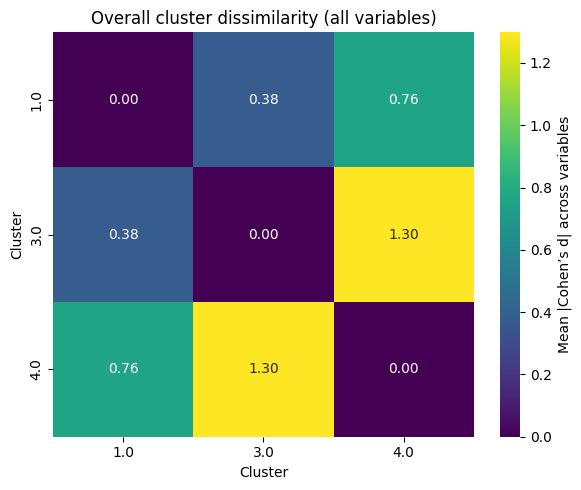

In [98]:
import numpy as np
import pandas as pd

clusters = sorted(weathercluster_df.cluster.unique())

# initialize accumulator
overall = pd.DataFrame(
    0.0, index=clusters, columns=clusters
)

for feat in features:
    mat = cohens_d_abs_matrix(weathercluster_df, feat)
    overall += mat

overall /= len(features)
plt.figure(figsize=(6, 5))
sns.heatmap(
    overall,
    cmap="viridis",
    annot=True,
    fmt=".2f",
    cbar_kws={"label": "Mean |Cohen’s d| across variables"}
)
plt.title("Overall cluster dissimilarity (all variables)")
plt.xlabel("Cluster")
plt.ylabel("Cluster")
plt.tight_layout()
plt.show()


In [233]:
records = []

for i in clusters:
    for j in clusters:
        if i >= j:
            continue

        ds = {}
        for feat in features:
            mat = cohens_d_abs_matrix(weathercluster_df, feat)
            ds[feat] = mat.loc[i, j]

        top_feat = max(ds, key=ds.get)

        records.append({
            "cluster_i": i,
            "cluster_j": j,
            "mean_abs_d": np.mean(list(ds.values())),
            "max_abs_d": ds[top_feat],
            "driving_variable": top_feat
        })

pairwise_summary = pd.DataFrame(records)


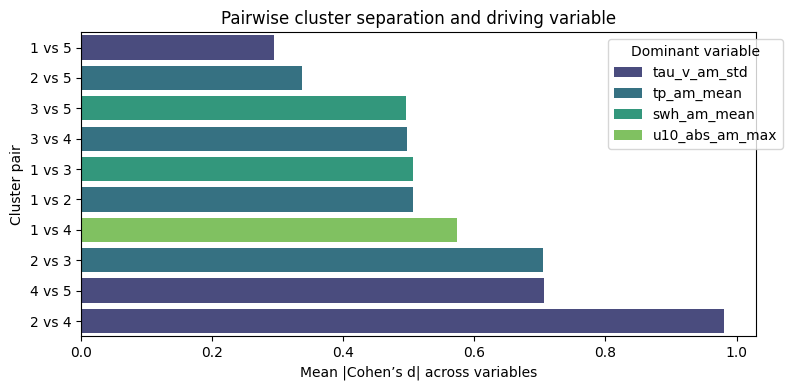

In [234]:
plt.figure(figsize=(8, 4))

sns.barplot(
    data=pairwise_summary.sort_values("mean_abs_d"),
    x="mean_abs_d",
    y=pairwise_summary.sort_values("mean_abs_d")
        .apply(lambda r: f"{r.cluster_i} vs {r.cluster_j}", axis=1),
    hue="driving_variable",
    dodge=False,
    palette="viridis"
)

plt.xlabel("Mean |Cohen’s d| across variables")
plt.ylabel("Cluster pair")
plt.title("Pairwise cluster separation and driving variable")
plt.legend(title="Dominant variable", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()


In [235]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


def mean_abs_cohens_d_vs_others(df, feature, cluster_id):
    """Mean |Cohen's d| of cluster vs all other clusters"""
    target = df.loc[df.cluster == cluster_id, feature]
    ds = []

    for other in df.cluster.unique():
        if other == cluster_id:
            continue
        comp = df.loc[df.cluster == other, feature]
        d = cohens_d(target, comp)
        if np.isfinite(d):
            ds.append(abs(d))

    return np.mean(ds) if ds else np.nan


In [236]:

features = ['swh_am_mean', 'aspect_deg_mean_0.1x0.1', 'u10_abs_am_max', 'tp_am_mean', 'tau_v_am_std']
clusters = sorted(weathercluster_df.cluster.unique())

rows = []

for c in clusters:
    for f in features:
        rows.append({
            "cluster": c,
            "feature": f,
            "mean_abs_d": mean_abs_cohens_d_vs_others(
                weathercluster_df, f, c
            )
        })

sep_df = pd.DataFrame(rows)

top2_df = (
    sep_df
    .sort_values(["cluster", "mean_abs_d"], ascending=[True, False])
    .groupby("cluster")
    .head(2)
)


/var/folders/2b/rpgq1g5d5qz2nhbpj5s4jnrc0000gq/T/ipykernel_66251/766518768.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  g = sns.catplot(


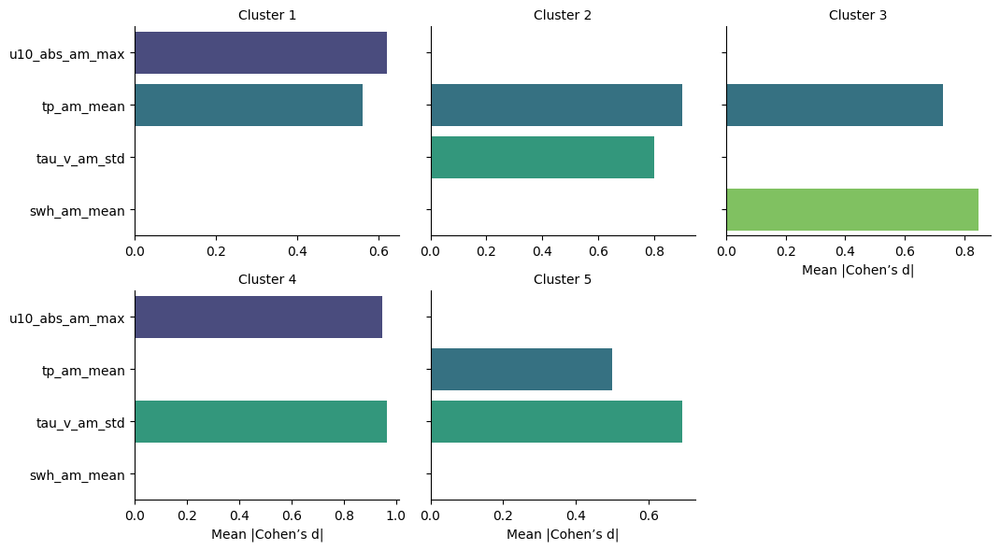

In [237]:
g = sns.catplot(
    data=top2_df,
    kind="bar",
    x="mean_abs_d",
    y="feature",
    col="cluster",
    col_wrap=3,
    sharex=False,
    height=3,
    aspect=1.2,
    palette="viridis"
)

g.set_titles("Cluster {col_name}")
g.set_xlabels("Mean |Cohen’s d|")
g.set_ylabels("")
plt.tight_layout()
plt.show()


In [238]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


def cohens_d_cluster_vs_rest(df, feature, cluster_id):
    a = df.loc[df.cluster == cluster_id, feature]
    b = df.loc[df.cluster != cluster_id, feature]
    return abs(cohens_d(a, b))


In [239]:

features = ['swh_am_mean', 'aspect_deg_mean_0.1x0.1', 'u10_abs_am_max', 'tp_am_mean', 'tau_v_am_std']
clusters = sorted(weathercluster_df.cluster.unique())

rows = []

for c in clusters:
    for f in features:
        rows.append({
            "cluster": c,
            "feature": f,
            "abs_d": cohens_d_cluster_vs_rest(
                weathercluster_df, f, c
            )
        })

sep_df = pd.DataFrame(rows)


In [240]:
top2_df = (
    sep_df
    .sort_values(["cluster", "abs_d"], ascending=[True, False])
    .groupby("cluster")
    .head(2)
)


/var/folders/2b/rpgq1g5d5qz2nhbpj5s4jnrc0000gq/T/ipykernel_66251/195459939.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


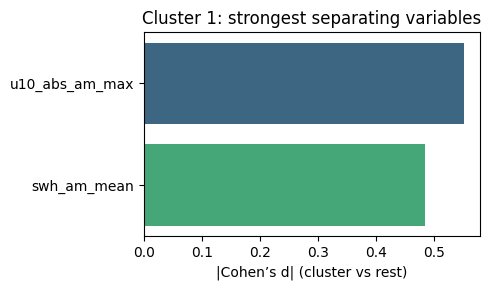

/var/folders/2b/rpgq1g5d5qz2nhbpj5s4jnrc0000gq/T/ipykernel_66251/195459939.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


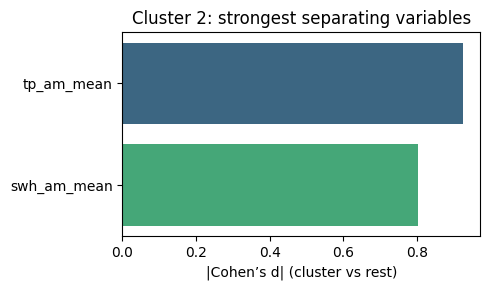

/var/folders/2b/rpgq1g5d5qz2nhbpj5s4jnrc0000gq/T/ipykernel_66251/195459939.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


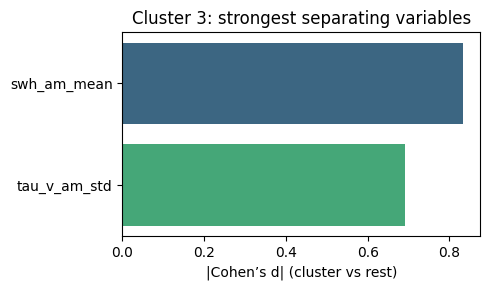

/var/folders/2b/rpgq1g5d5qz2nhbpj5s4jnrc0000gq/T/ipykernel_66251/195459939.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


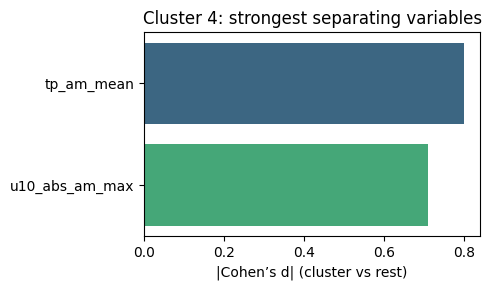

/var/folders/2b/rpgq1g5d5qz2nhbpj5s4jnrc0000gq/T/ipykernel_66251/195459939.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


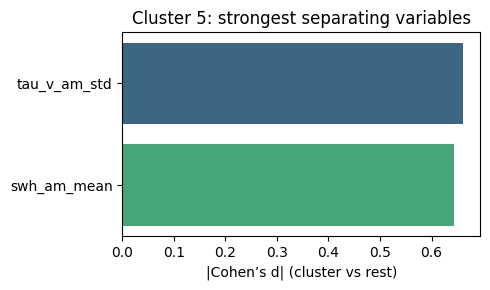

In [241]:
for c in clusters:
    sub = top2_df[top2_df.cluster == c]

    plt.figure(figsize=(5, 3))
    sns.barplot(
        data=sub,
        x="abs_d",
        y="feature",
        palette="viridis"
    )

    plt.title(f"Cluster {c}: strongest separating variables")
    plt.xlabel("|Cohen’s d| (cluster vs rest)")
    plt.ylabel("")
    plt.tight_layout()
    plt.show()


Interpretation

|d| ≈ 0.2 → small

|d| ≈ 0.5 → medium

|d| ≥ 0.8 → large separation

|d| ≥ 1.2 → very strong

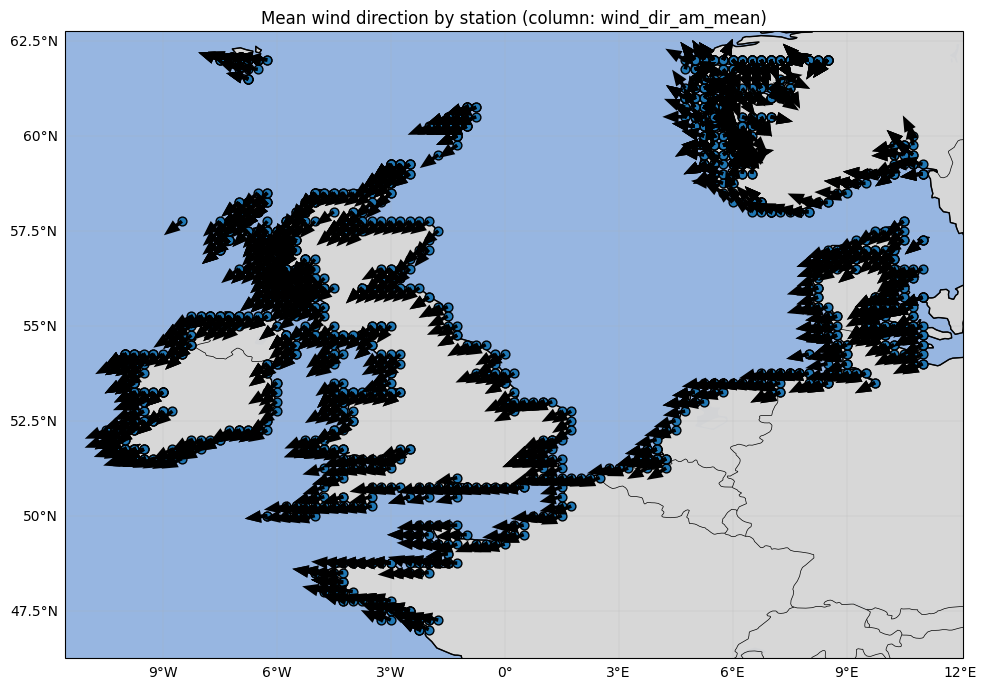

In [99]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ---- Inputs you may need to adjust ----
df = weathercluster_df.copy()

# Required columns: station + lat/lon
req = {"station", "lat", "lon"}
assert req.issubset(df.columns), f"weather_cluster_df must include {req}"

# Try to auto-detect a wind-direction column (degrees)
cand_cols = [c for c in df.columns if any(s in c.lower() for s in ["wind_dir", "winddirection", "wd", "wdir", "dir"])]
if not cand_cols:
    raise ValueError("Couldn't auto-detect wind direction column. Set wind_dir_col manually.")
wind_dir_col = cand_cols[0]   # <-- or set manually, e.g. wind_dir_col = "wind_dir"

# If your wind direction is in radians, convert it before proceeding.
# df[wind_dir_col] = np.rad2deg(df[wind_dir_col])

# ---- Clean numeric ----
df["lon"] = pd.to_numeric(df["lon"], errors="coerce")
df["lat"] = pd.to_numeric(df["lat"], errors="coerce")
df[wind_dir_col] = pd.to_numeric(df[wind_dir_col], errors="coerce")
df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=["station","lon","lat",wind_dir_col])

# ---- Circular mean per station (degrees) ----
# Assumption: wind direction is METEOROLOGICAL degrees (0=N, 90=E) and indicates "FROM" direction.
# We'll plot arrows pointing TO where wind is going (common for vector arrows).
theta_from = df[wind_dir_col].values % 360.0
theta_to = (theta_from + 180.0) % 360.0

# Circular mean: mean of unit vectors (using "TO" direction)
rad = np.deg2rad(theta_to)
df["_sin"] = np.sin(rad)
df["_cos"] = np.cos(rad)

station_mean = (
    df.groupby("station", as_index=False)
      .agg(lon=("lon","mean"),
           lat=("lat","mean"),
           sin_mean=("_sin","mean"),
           cos_mean=("_cos","mean"))
)

# Mean direction (TO), in degrees meteorological
mean_rad = np.arctan2(station_mean["sin_mean"].values, station_mean["cos_mean"].values)
mean_deg_to = (np.rad2deg(mean_rad) + 360.0) % 360.0
station_mean["mean_wind_dir_to_deg"] = mean_deg_to

# Convert MET degrees (0=N, clockwise) -> plotting components (x=lon/east, y=lat/north)
# MET "TO" degrees: 0=N means arrow points +y. 90=E means +x.
theta = np.deg2rad(station_mean["mean_wind_dir_to_deg"].values)
u = np.sin(theta)   # east component
v = np.cos(theta)   # north component

# ---- Map ----
proj = ccrs.PlateCarree()
fig = plt.figure(figsize=(11, 7))
ax = plt.axes(projection=proj)

lon_min, lon_max = station_mean["lon"].min(), station_mean["lon"].max()
lat_min, lat_max = station_mean["lat"].min(), station_mean["lat"].max()
pad_lon = max(0.5, 0.05 * (lon_max - lon_min))
pad_lat = max(0.5, 0.05 * (lat_max - lat_min))
ax.set_extent([lon_min - pad_lon, lon_max + pad_lon, lat_min - pad_lat, lat_max + pad_lat], crs=proj)

ax.add_feature(cfeature.OCEAN, zorder=0)
ax.add_feature(cfeature.LAKES, alpha=0.5, zorder=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.5, zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.8, zorder=4)
ax.add_feature(cfeature.LAND, facecolor="lightgray", edgecolor="black", alpha=0.9, zorder=2)

gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0.5)
gl.top_labels = False
gl.right_labels = False

# Plot station points
ax.scatter(station_mean["lon"], station_mean["lat"], s=40, transform=proj, zorder=10, edgecolors="k")

# Quiver: constant-length arrows; scale_units='xy' keeps units consistent
# Increase/decrease 'arrow_len' to taste.
arrow_len = 0.6
ax.quiver(
    station_mean["lon"].values,
    station_mean["lat"].values,
    u * arrow_len,
    v * arrow_len,
    transform=proj,
    zorder=20,
    angles="xy",
    scale_units="xy",
    scale=1,
    width=0.004,
    headwidth=3.5,
    headlength=4.5
)

ax.set_title(f"Mean wind direction by station (column: {wind_dir_col})")
plt.tight_layout()
plt.show()


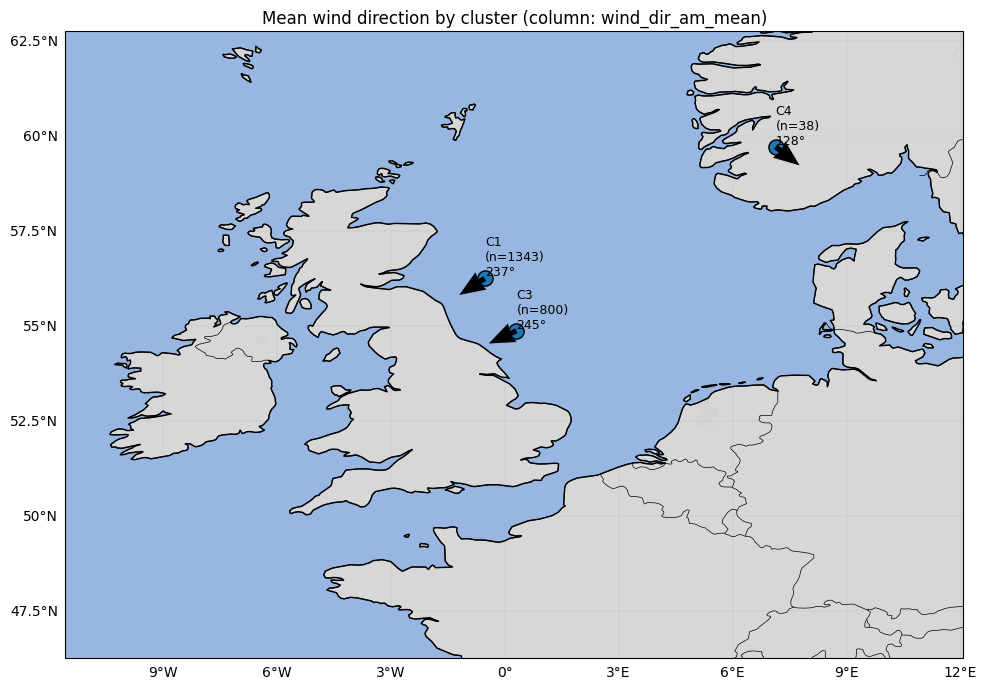

   cluster     n        lat       lon  mean_wind_dir_to_deg
0      1.0  1343  56.243485 -0.525130            237.146692
1      3.0   800  54.865313  0.307500            245.291824
2      4.0    38  59.710526  7.131579            127.831506


In [100]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

df = weathercluster_df.copy()

# --- Required columns ---
req = {"cluster", "lat", "lon"}
assert req.issubset(df.columns), f"weathercluster_df must include {req}"

# --- Auto-detect wind direction column (degrees) ---
cand_cols = [c for c in df.columns if any(s in c.lower() for s in ["wind_dir", "winddirection", "wd", "wdir", "dir"])]
if not cand_cols:
    raise ValueError("Couldn't auto-detect wind direction column. Set wind_dir_col manually.")
wind_dir_col = cand_cols[0]  # or set explicitly

# --- Clean numeric ---
for c in ["lon", "lat", "cluster", wind_dir_col]:
    df[c] = pd.to_numeric(df[c], errors="coerce")
df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=["lon", "lat", "cluster", wind_dir_col])

# --- Circular mean per cluster (meteorological degrees; assumed 'FROM') ---
theta_from = df[wind_dir_col].values % 360.0
theta_to = (theta_from + 180.0) % 360.0  # plot arrows pointing where wind goes

rad = np.deg2rad(theta_to)
df["_sin"] = np.sin(rad)
df["_cos"] = np.cos(rad)

cluster_mean = (
    df.groupby("cluster", as_index=False)
      .agg(lon=("lon", "mean"),
           lat=("lat", "mean"),
           sin_mean=("_sin", "mean"),
           cos_mean=("_cos", "mean"),
           n=("cluster", "size"))
)

mean_rad = np.arctan2(cluster_mean["sin_mean"].values, cluster_mean["cos_mean"].values)
mean_deg_to = (np.rad2deg(mean_rad) + 360.0) % 360.0
cluster_mean["mean_wind_dir_to_deg"] = mean_deg_to

# Components for plotting (MET degrees: 0=N, 90=E)
theta = np.deg2rad(cluster_mean["mean_wind_dir_to_deg"].values)
u = np.sin(theta)   # east
v = np.cos(theta)   # north

# --- Map ---
proj = ccrs.PlateCarree()
fig = plt.figure(figsize=(11, 7))
ax = plt.axes(projection=proj)

lon_min, lon_max = df["lon"].min(), df["lon"].max()
lat_min, lat_max = df["lat"].min(), df["lat"].max()
pad_lon = max(0.5, 0.05 * (lon_max - lon_min))
pad_lat = max(0.5, 0.05 * (lat_max - lat_min))
ax.set_extent([lon_min - pad_lon, lon_max + pad_lon, lat_min - pad_lat, lat_max + pad_lat], crs=proj)

ax.add_feature(cfeature.OCEAN, zorder=0)
ax.add_feature(cfeature.LAKES, alpha=0.5, zorder=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.5, zorder=3)
ax.add_feature(cfeature.COASTLINE, linewidth=0.8, zorder=4)
ax.add_feature(cfeature.LAND, facecolor="lightgray", edgecolor="black", alpha=0.9, zorder=2)

gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0.5)
gl.top_labels = False
gl.right_labels = False

# Cluster centroid points
ax.scatter(cluster_mean["lon"], cluster_mean["lat"], s=120, transform=proj, zorder=10, edgecolors="k")

# Cluster mean direction arrows
arrow_len = 0.8
ax.quiver(
    cluster_mean["lon"].values,
    cluster_mean["lat"].values,
    u * arrow_len,
    v * arrow_len,
    transform=proj,
    zorder=20,
    angles="xy",
    scale_units="xy",
    scale=1,
    width=0.006,
    headwidth=3.8,
    headlength=4.8
)

# Label clusters (optionally include n)
for _, r in cluster_mean.iterrows():
    ax.text(
        r["lon"], r["lat"],
        f"C{int(r['cluster'])}\n(n={int(r['n'])})\n{r['mean_wind_dir_to_deg']:.0f}°",
        transform=proj,
        ha="left", va="bottom",
        fontsize=9,
        zorder=30
    )

ax.set_title(f"Mean wind direction by cluster (column: {wind_dir_col})")
plt.tight_layout()
plt.show()

# Also print the table for inspection
display_cols = ["cluster", "n", "lat", "lon", "mean_wind_dir_to_deg"]
print(cluster_mean[display_cols].sort_values("cluster"))


In [244]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

cluster_means = weathercluster_df.groupby("cluster")[top].mean()

# Column-wise min–max for coloring
color_data = (
    cluster_means - cluster_means.min()
) / (
    cluster_means.max() - cluster_means.min()
)

plt.figure(figsize=(8, 4))
sns.heatmap(
    color_data,
    annot=cluster_means.round(2),  # <-- actual values
    fmt="",
    cmap="coolwarm",
    vmin=0,
    vmax=1,
    cbar_kws={"label": "Relative position within variable"}
)
plt.title("Cluster Centroids (actual values, min–max color-scaled per variable)")
plt.ylabel("Cluster")
plt.tight_layout()
plt.show()


TypeError: unhashable type: 'DataFrame'

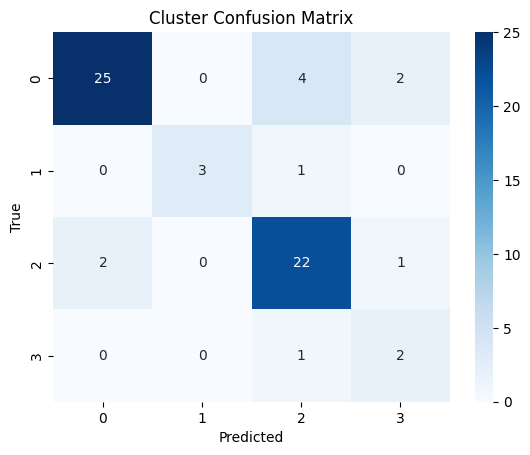

In [101]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Cluster Confusion Matrix")
plt.show()



In [246]:
cluster_means_minmax = (
    cluster_means - cluster_means.min()
) / (
    cluster_means.max() - cluster_means.min()
)

plt.figure(figsize=(8, 4))
sns.heatmap(
    cluster_means_minmax,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    vmin=0,
    vmax=1
)
plt.title("Cluster Centroids (min–max per variable)")
plt.ylabel("Cluster")
plt.tight_layout()
plt.show()


NameError: name 'cluster_means' is not defined